In [1]:
# Import package
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import igraph
import scvelo as scv
import loompy as lmp
import anndata as ad
import harmonypy as hm
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

import celltypist
from celltypist import models
from celltypist.models import Model

/home/jaehyunchoi/.conda/envs/test02/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/jaehyunchoi/.conda/envs/test02/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/jaehyunchoi/.conda/envs/test02/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/jaehyunchoi/.conda/envs/test02/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/jaehyunchoi/.conda/envs/test02/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarn

# IPF public data preprocessing

In [2]:
adata_IPF=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_public_atlas_002.h5ad")

In [3]:
adata_IPF

AnnData object with n_obs × n_vars = 385988 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal'

In [4]:
sc.pp.normalize_total(adata_IPF, target_sum=1e4)
sc.pp.log1p(adata_IPF)

In [5]:
# 변수 유전자 설정 
sc.pp.highly_variable_genes(adata_IPF, flavor='seurat', n_top_genes=2000)

[[  0.2644937    0.42308953 -11.678457     6.689795    -4.515862  ]
 [  2.2301316    2.1400776  -14.065041     8.464436    -5.344402  ]
 [  0.5797527    0.3022518  -12.332625     6.0909758   -4.014886  ]
 [  0.84397143   0.9416282  -11.976189     6.900067    -2.7954178 ]
 [  3.011747     2.0102594  -11.770454     6.1746144   -2.6827323 ]]


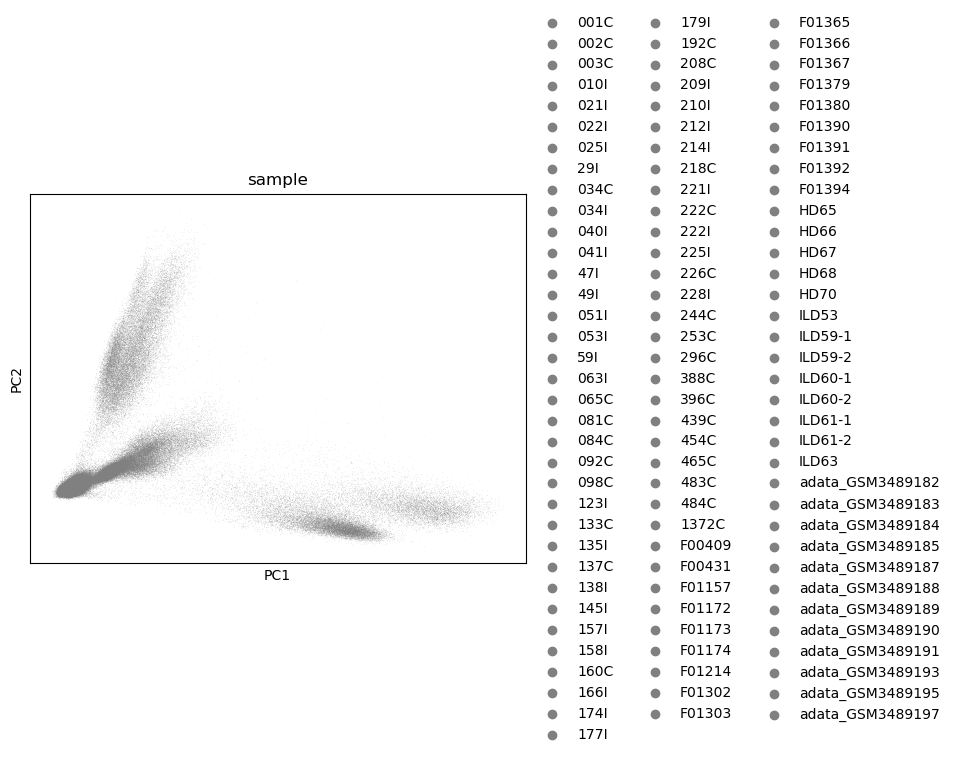

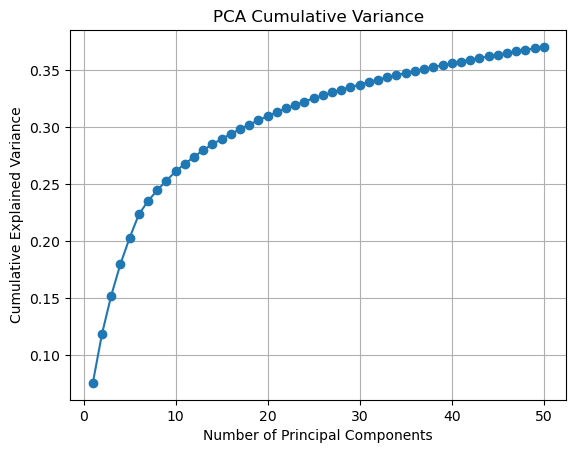

In [6]:
# Scale data
sc.pp.scale(adata_IPF, max_value=10)
# Run PCA
sc.tl.pca(adata_IPF, svd_solver='arpack')
print(adata_IPF.obsm['X_pca'][:5, :5])
sc.pl.pca(adata_IPF, color='sample')

import matplotlib.pyplot as plt
var_ratio = adata_IPF.uns['pca']['variance_ratio']
plt.plot(range(1, len(var_ratio) + 1), np.cumsum(var_ratio), marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Cumulative Variance')
plt.grid(True)
plt.show()

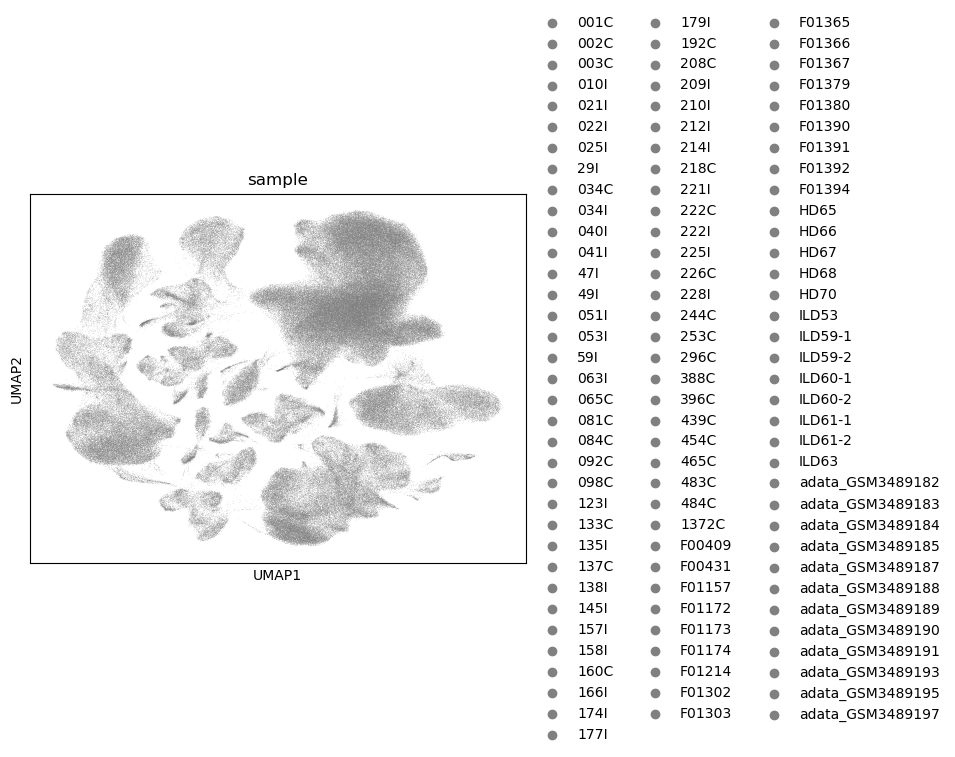

In [7]:
# t-sne 
sc.tl.tsne(adata_IPF, use_rep='X_pca', n_pcs=30)
# umap
sc.pp.neighbors(adata_IPF, n_pcs=30, use_rep='X_pca')
sc.tl.umap(adata_IPF)
sc.pl.umap(adata_IPF, color=['sample'])

In [8]:
sc.logging.print_header()
print(f"celltypist=={celltypist.__version__}")

scanpy==1.10.3 anndata==0.11.1 umap==0.5.7 numpy==1.26.4 scipy==1.14.1 pandas==2.2.2 scikit-learn==1.1.3 statsmodels==0.14.4 igraph==0.11.8 pynndescent==0.5.13
celltypist==1.7.0


In [9]:
adata_IPF

AnnData object with n_obs × n_vars = 385988 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'sample_colors', 'tsne', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

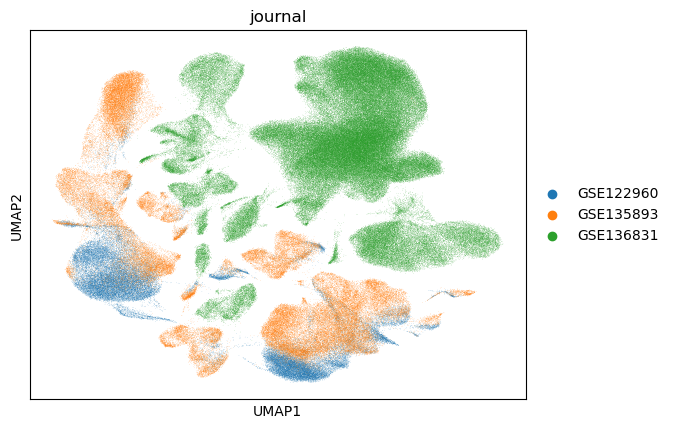

In [10]:
sc.pl.umap(adata_IPF, color=['journal'])

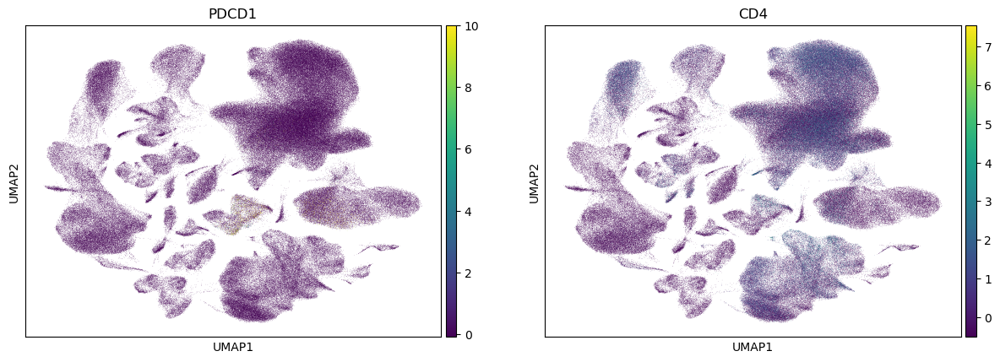

In [11]:
sc.pl.umap(adata_IPF, color=['PDCD1','CD4'])

2025-07-21 22:45:31,272 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2025-07-21 22:47:21,441 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-07-21 22:47:23,434 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-07-21 22:52:11,865 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-07-21 22:56:42,224 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2025-07-21 23:01:21,776 - harmonypy - INFO - Iteration 4 of 10
Iteration 4 of 10
2025-07-21 23:06:20,044 - harmonypy - INFO - Iteration 5 of 10
Iteration 5 of 10
2025-07-21 23:11:13,664 - harmonypy - INFO - Iteration 6 of 10
Iteration 6 of 10
2025-07-21 23:14:35,380 - harmonypy - INFO - Iteration 7 of 10
Iteration 7 of 10
2025-07-21 23:16:48,101 - harmonypy - INFO - Iteration 8 of 10
Iteration 8 of 10
2025-07-21 23:18:45,527 - harmonypy - INFO - Iteration 9 of 10
Iteration 9 of 10

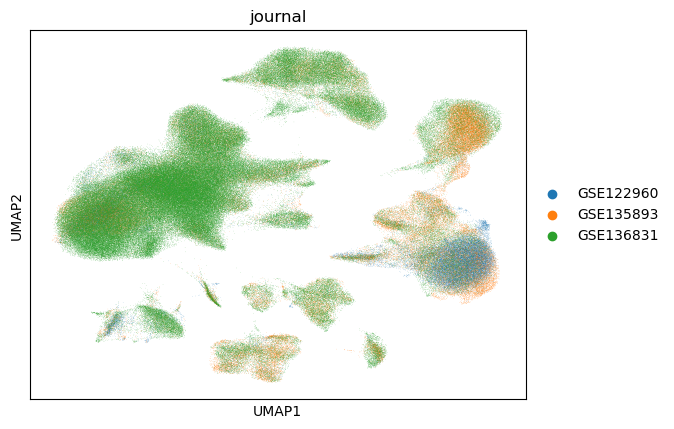

In [12]:
# Harmony로 batch effect 제거
harmony_out = hm.run_harmony(adata_IPF.obsm['X_pca'],adata_IPF.obs, 'sample')

# Harmony 결과를 저장
adata_IPF.obsm['X_pca_harmony'] = harmony_out.Z_corr.T

# UMAP을 사용한 시각화
sc.pp.neighbors(adata_IPF, use_rep='X_pca_harmony')  # Harmony 결과를 사용
sc.tl.umap(adata_IPF)
sc.pl.umap(adata_IPF, color=['journal'])

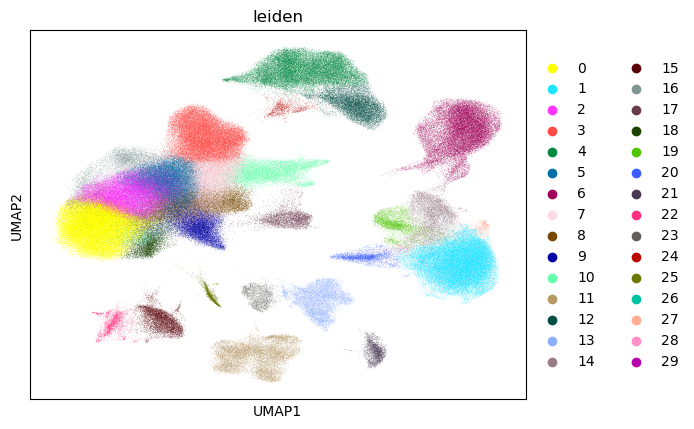

In [13]:
sc.tl.leiden(adata_IPF, resolution=1.0, key_added="leiden")
sc.pl.umap(adata_IPF, color=['leiden'])

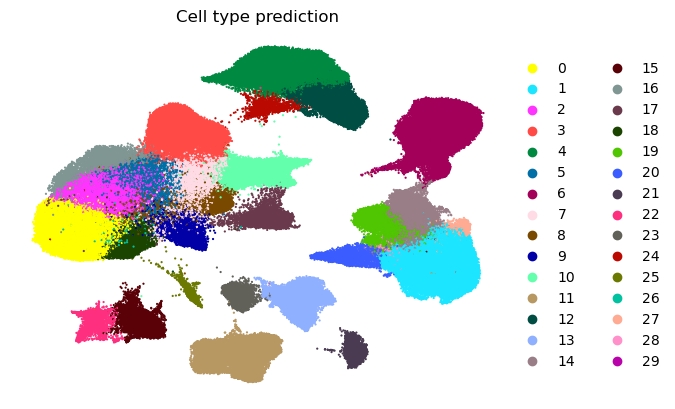

In [14]:
sc.pl.umap(
    adata_IPF,
    color='leiden',
    frameon=False,
    title='Cell type prediction',
    size=10
)

In [15]:
adata_IPF.write("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_public_atlas_003.h5ad")

In [16]:
metadata=pd.read_csv("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_public_atlas_obs.csv", index_col=0)

In [17]:
print(adata_IPF.obs.shape)
print(metadata.shape)
print(adata_IPF.obs.index.equals(metadata.index))

(385988, 6)
(385988, 12)
True


In [18]:
adata_IPF

AnnData object with n_obs × n_vars = 385988 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'sample_colors', 'tsne', 'neighbors', 'umap', 'journal_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [19]:
adata_IPF.obs = metadata

In [71]:
adata_merged= sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_public_atlas_002.h5ad")
sc.pp.normalize_total(adata_merged, target_sum=1e4)
sc.pp.log1p(adata_merged)
predictions_ipf = celltypist.annotate(adata_merged, model = 'Human_IPF_Lung.pkl', majority_voting = True)
adata_merged = predictions_ipf.to_adata()
adata_IPF.obs['celltypist_IPF']=adata_merged.obs['predicted_labels']

adata_IPF

🔬 Input data has 385988 cells and 20551 genes
🔗 Matching reference genes in the model
🧬 3707 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
⛓️ Over-clustering input data with resolution set to 30
🗳️ Majority voting the predictions
✅ Majority voting done!


AnnData object with n_obs × n_vars = 385988 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'sample_colors', 'tsne', 'neighbors', 'umap', 'state_colors', 'journal_colors', 'leiden', 'leiden_colors', 'celltypist_IPF_colors', 'celltypist_PF_colors', 'celltypist_atlas_colors', 'celltypist_Atlas_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

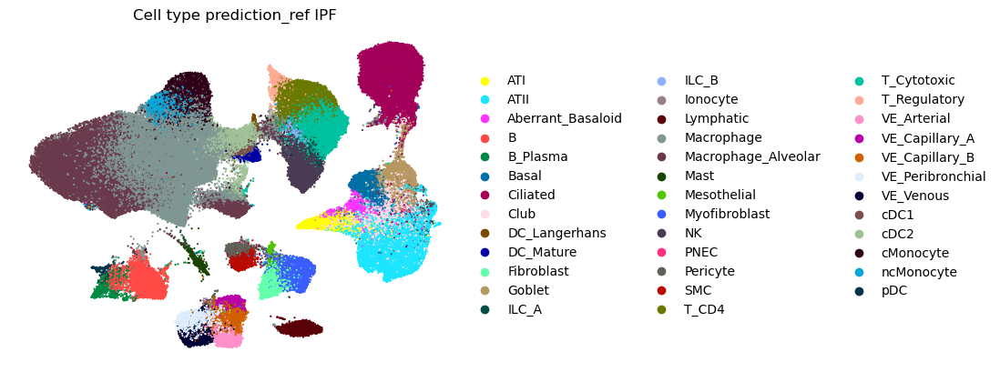

In [72]:
sc.pl.umap(
    adata_IPF,
    color='celltypist_IPF',
    frameon=False,
    title='Cell type prediction_ref IPF',
    size=10
)

In [20]:
adata_IPF

AnnData object with n_obs × n_vars = 385988 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'sample_colors', 'tsne', 'neighbors', 'umap', 'journal_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

... storing 'celltype_category_IPF' as categorical


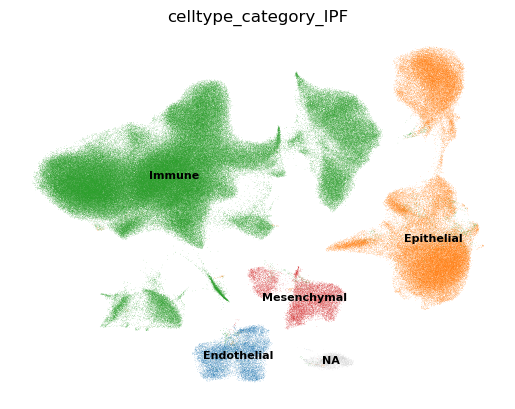

In [169]:
adata_IPF.obs["celltype_category_IPF"] = adata_IPF.obs["celltypist_IPF"].map(label_to_category_IPF)
sc.pl.umap(
    adata_IPF,
    color="celltype_category_IPF",
    legend_loc="on data",
    legend_fontsize=8,
    frameon=False
)

In [177]:
adata_IPF.obs['celltype_category_IPF']

AAACCTGAGCGTTTAC-1-adata_GSM3489182    Epithelial
AAACCTGAGTCGCCGT-1-adata_GSM3489182    Epithelial
AAACCTGGTAGGACAC-1-adata_GSM3489182    Epithelial
AAACCTGGTGCCTTGG-1-adata_GSM3489182    Epithelial
AAACCTGGTTCAGCGC-1-adata_GSM3489182    Epithelial
                                          ...    
59I_TTTGGTTTCATCGGAT                       Immune
59I_TTTGTCAAGACCCACC                       Immune
59I_TTTGTCAAGATGTTAG                       Immune
59I_TTTGTCACATTCTCAT                       Immune
59I_TTTGTCATCTATCCCG                       Immune
Name: celltype_category_IPF, Length: 385988, dtype: category
Categories (4, object): ['Endothelial', 'Epithelial', 'Immune', 'Mesenchymal']

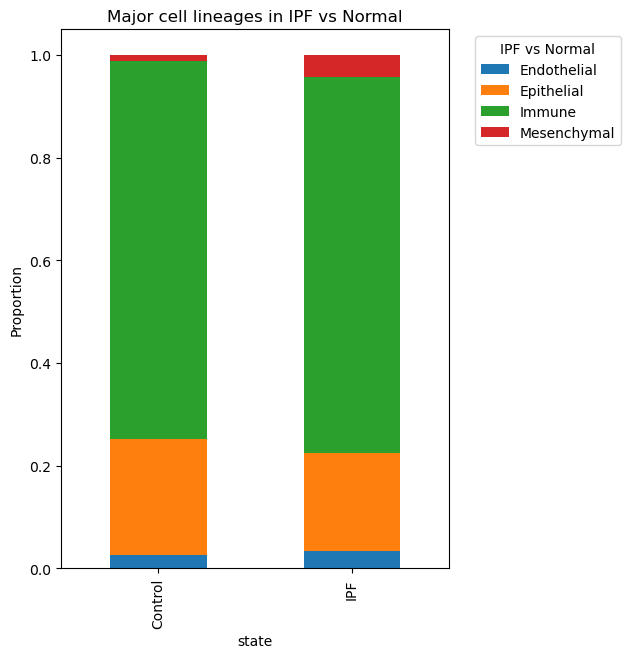

In [184]:
cluster_labels = adata_IPF.obs['celltype_category_IPF']
batch_labels = adata_IPF.obs['state']
crosstab = pd.crosstab(batch_labels, cluster_labels, normalize='index')

crosstab.plot(kind='bar', stacked=True, figsize=(5, 7))
plt.title('Major cell lineages in IPF vs Normal')
plt.ylabel('Proportion')
plt.xlabel('state')
plt.legend(title='IPF vs Normal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

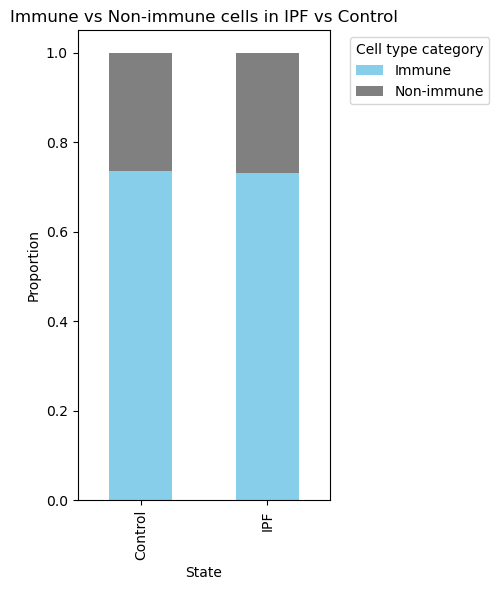

In [182]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. 기존 라벨 가져오기
cluster_labels = adata_IPF.obs['celltype_category_IPF']
batch_labels = adata_IPF.obs['state']

# 2. Immune vs Non-immune로 이진화
# 기준: label에 "immune"이라는 단어가 포함되면 Immune
immune_mask = cluster_labels.str.lower().str.contains('immune')  # 또는 정확한 리스트로 비교도 가능

# 새로운 그룹 만들기
immune_status = immune_mask.map({True: 'Immune', False: 'Non-immune'})

# 3. 교차표 생성
crosstab = pd.crosstab(batch_labels, immune_status, normalize='index')

# 4. 시각화
crosstab.plot(kind='bar', stacked=True, figsize=(5, 6), color=["skyblue", "gray"])
plt.title('Immune vs Non-immune cells in IPF vs Control')
plt.ylabel('Proportion')
plt.xlabel('State')
plt.legend(title='Cell type category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

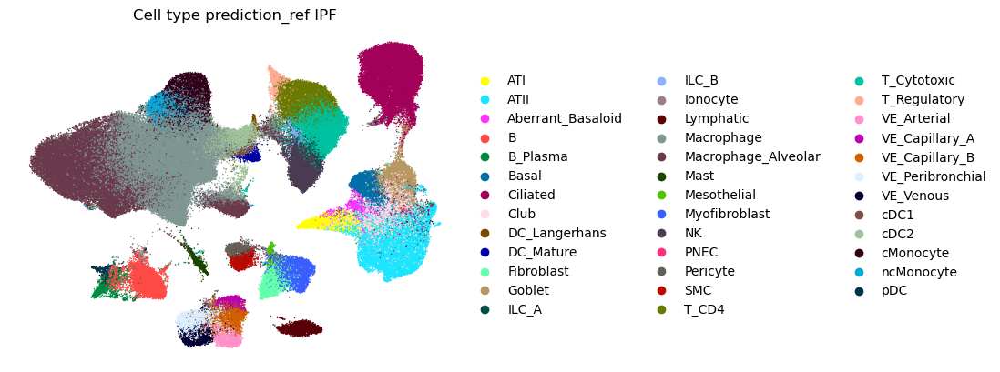

In [275]:
sc.pl.umap(
    adata_IPF,
    color='celltypist_IPF',
    frameon=False,
    title='Cell type prediction_ref IPF',
    size=5
)

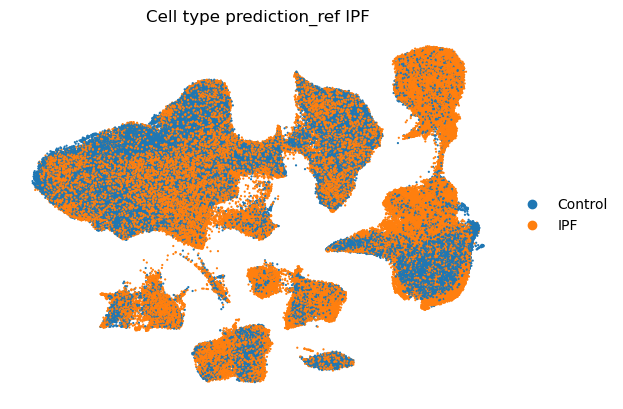

In [269]:
sc.pl.umap(
    adata_IPF,
    color='state',
    frameon=False,
    title='Cell type prediction_ref IPF',
    size=10
)

In [264]:
adata_IPF

AnnData object with n_obs × n_vars = 385988 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'celltype_category_IPF', 'celltypist_immune'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'sample_colors', 'tsne', 'neighbors', 'umap', 'state_colors', 'journal_colors', 'leiden', 'leiden_colors', 'celltypist_IPF_colors', 'celltypist_PF_colors', 'celltypist_atlas_colors', 'celltypist_Atlas_colors', 'celltype_category_IPF_colors', 'celltypist_immune_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
sc.pl.umap(adata[adata.obs['state'] == 'Donor'], color='cluster', title='Donor')
sc.pl.umap(adata[adata.obs['state'] == 'IPF'], color='cluster', title='IPF')

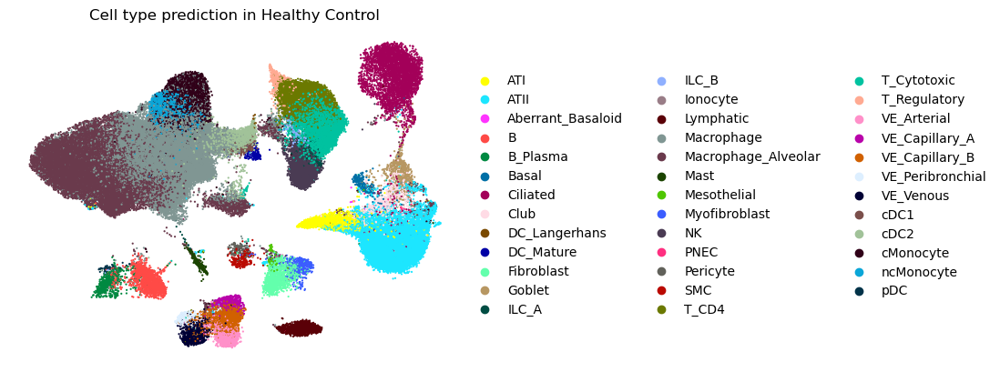

In [270]:
sc.pl.umap(
    adata_IPF[adata_IPF.obs['state'] == 'Control'],
    color='celltypist_IPF',
    frameon=False,
    title='Cell type prediction in Healthy Control',
    size=10
)

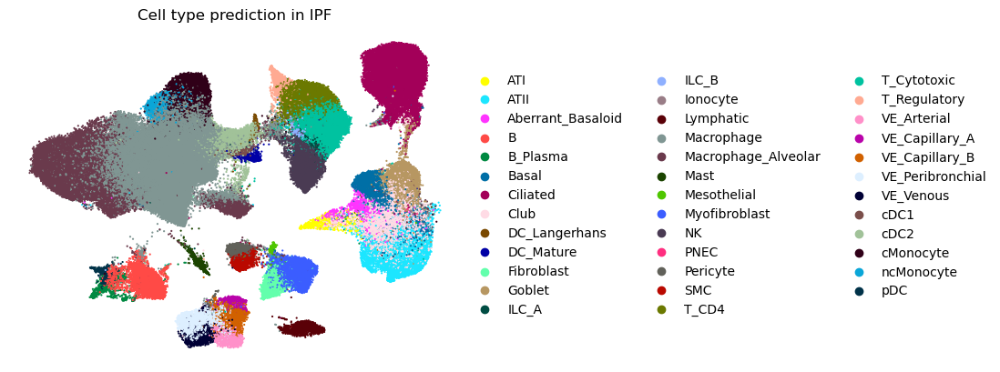

In [271]:
sc.pl.umap(
    adata_IPF[adata_IPF.obs['state'] == 'IPF'],
    color='celltypist_IPF',
    frameon=False,
    title='Cell type prediction in IPF',
    size=10
)

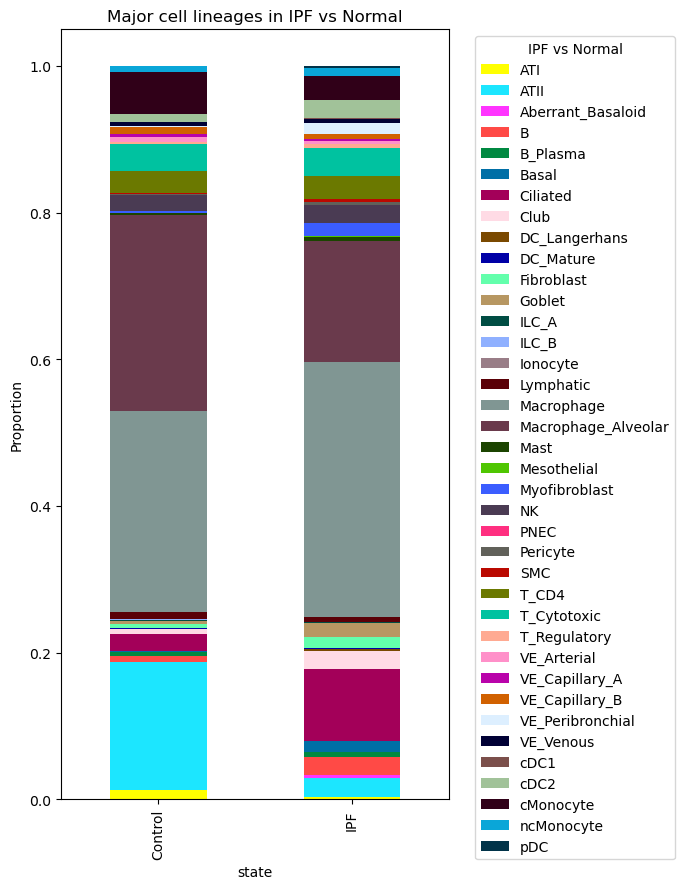

In [30]:
# 2. crosstab 생성
cluster_labels = adata_IPF.obs['celltypist_IPF']
batch_labels = adata_IPF.obs['state']
crosstab = pd.crosstab(batch_labels, cluster_labels, normalize='index')

# 3. matplotlib barplot 그릴 때 palette 지정
crosstab.plot(
    kind='bar',
    stacked=True,
    figsize=(5, 10),
    color=[palette_dict[col] for col in crosstab.columns]
)

plt.title('Major cell lineages in IPF vs Normal')
plt.ylabel('Proportion')
plt.xlabel('state')
plt.legend(title='IPF vs Normal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig("/home/jaehyunchoi/bystander_collaboration/IPF_data/analysis/figures/3publicatlas_celltypist_IPF_state_stackedbargraph.pdf", bbox_inches='tight', dpi=300)

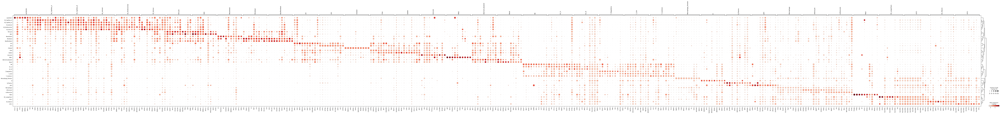

In [5]:
sc.tl.dendrogram(adata_IPF,groupby='celltypist_IPF')
sc.tl.rank_genes_groups(adata_IPF, groupby='celltypist_IPF', method='wilcoxon')
sc.pl.rank_genes_groups_dotplot(adata_IPF, n_genes=10)

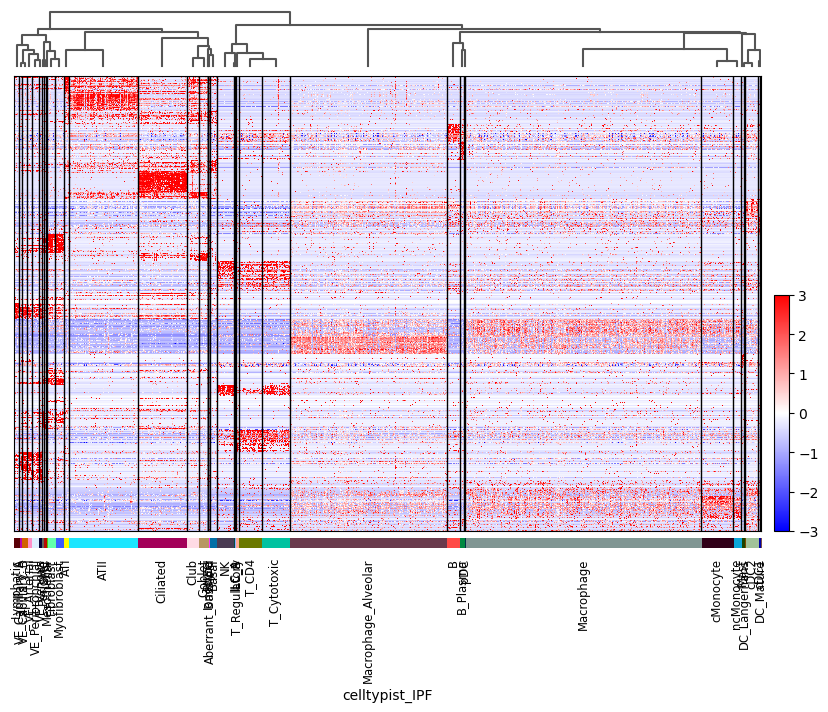

In [6]:
rank_df = sc.get.rank_genes_groups_df(adata_IPF, group=None)
top_genes = rank_df.groupby("group")["names"].apply(lambda x: x.head(20)).explode().unique().tolist()
sc.pl.heatmap(
    adata_IPF,
    var_names=top_genes,
    groupby="celltypist_IPF",
    use_raw=False,
    cmap="bwr",
    vmin=-3,
    vmax=3,
    swap_axes=True,
    dendrogram=True,
    show=True,
    figsize=(10, 7)
)

In [12]:
# 그룹별 샘플링 수
n_cells_per_group = 100
groups = adata_IPF.obs['celltypist_IPF'].unique()

selected_indices = []

for group in groups:
    group_cells = adata_IPF.obs[adata_IPF.obs['celltypist_IPF'] == group].index
    n = min(len(group_cells), n_cells_per_group)  # 그룹 크기가 작을 경우 자동 조절
    sampled = np.random.choice(group_cells, n, replace=False)
    selected_indices.extend(sampled)

adata_sampled = adata_IPF[selected_indices]

{'heatmap_ax': <Axes: >,
 'groupby_ax': <Axes: xlabel='celltypist_IPF'>,
 'gene_groups_ax': <Axes: >}

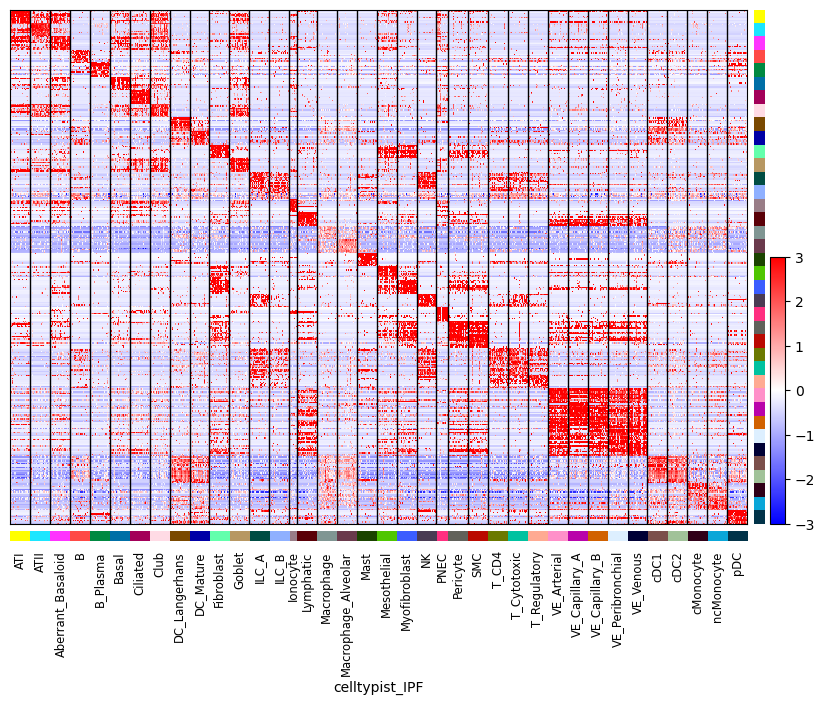

In [13]:
sc.pl.rank_genes_groups_heatmap(
    adata_sampled,
    n_genes=10,
    groupby="celltypist_IPF",
    use_raw=False,
    swap_axes=True,
    vmin=-3,
    vmax=3,
    dendrogram=False,
    figsize=(10, 7),
    cmap="bwr",
    show=False,
    show_gene_labels=False
)

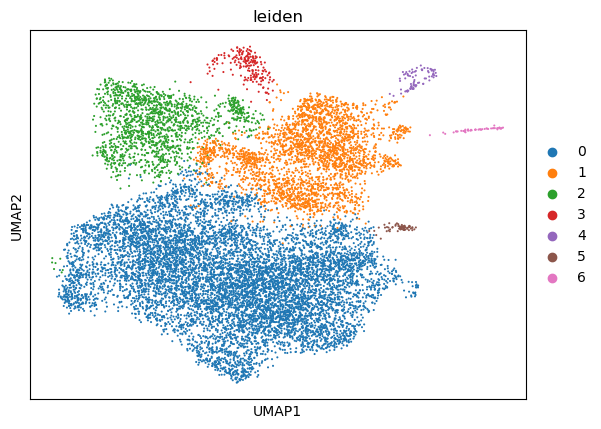

In [208]:
sc.tl.leiden(adata_CD4, resolution=0.18, key_added="leiden")
sc.pl.umap(adata_CD4, color=['leiden'])

In [209]:
import scanpy as sc
from sklearn.metrics import silhouette_score

# 예: PCA 기반 거리에서 leiden 클러스터링 평가
X = adata_CD4.obsm['X_pca']
labels = adata_CD4.obs['leiden'].astype(str)  # 꼭 문자열로!

score = silhouette_score(X, labels)
print("Silhouette score:", score)

Silhouette score: 0.13909638


In [210]:
adata_CD4.obs['leiden'].value_counts()

leiden
0    8832
1    2782
2    1488
3     196
4      79
5      63
6      47
Name: count, dtype: int64

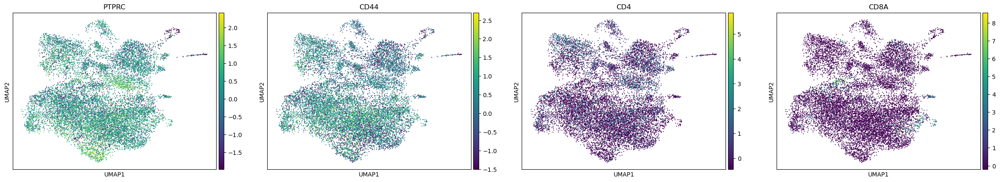

In [196]:
sc.pl.umap(adata_CD4, color=['PTPRC','CD44','CD4','CD8A'],legend_loc = 'on data')

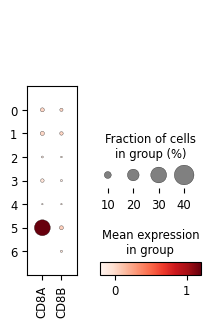

In [212]:
sc.pl.dotplot(adata_CD4,["CD8A", "CD8B"
], groupby="leiden", standard_scale=None)

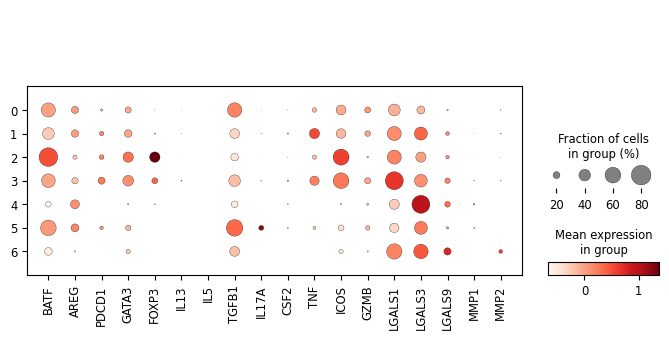

In [214]:
sc.pl.dotplot(adata_CD4,["BATF", "AREG", "PDCD1", "GATA3", "FOXP3", "IL13", "IL5", "TGFB1", "IL17A", "CSF2", "TNF", "ICOS", "GZMB", "LGALS1", "LGALS3", "LGALS9", "MMP1", "MMP2"
], groupby="leiden", standard_scale=None)

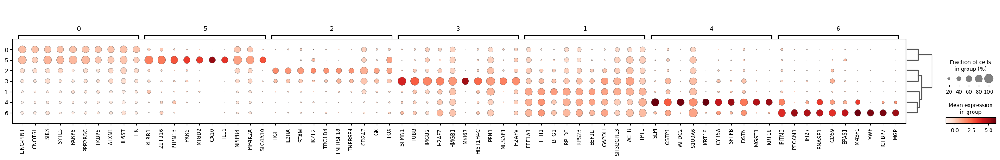

In [215]:
sc.tl.dendrogram(adata_CD4,groupby='leiden')
sc.tl.rank_genes_groups(adata_CD4, groupby='leiden', method='wilcoxon')
sc.pl.rank_genes_groups_dotplot(adata_CD4, n_genes=10)

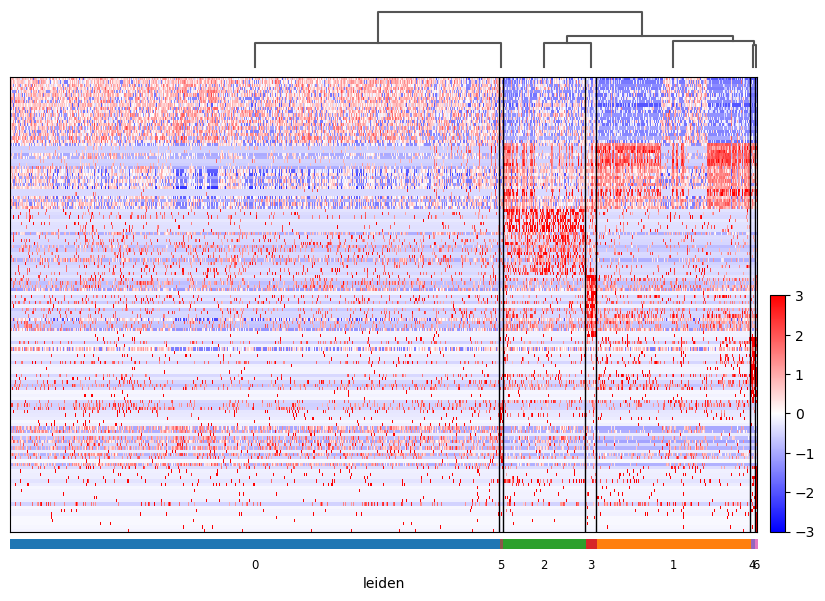

In [216]:
rank_df = sc.get.rank_genes_groups_df(adata_CD4, group=None)
top_genes = rank_df.groupby("group")["names"].apply(lambda x: x.head(20)).explode().unique().tolist()
sc.pl.heatmap(
    adata_CD4,
    var_names=top_genes,
    groupby="leiden",
    use_raw=False,
    cmap="bwr",
    vmin=-3,
    vmax=3,
    swap_axes=True,
    dendrogram=True,
    show=True,
    figsize=(10, 7)
)

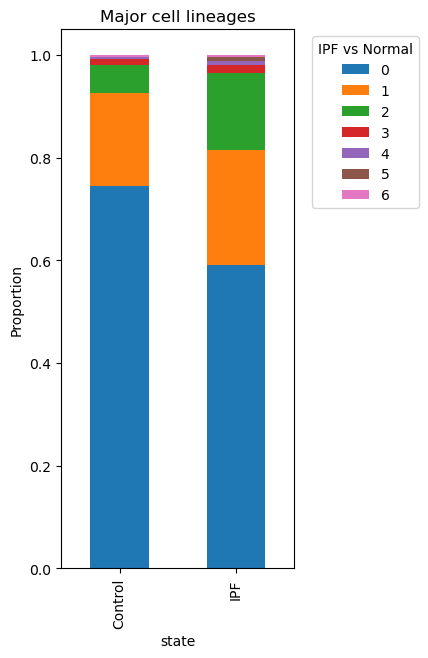

In [218]:
# Make Stacked bargraph for the comparison of cluster compositions
cluster_labels = adata_CD4.obs['leiden']
batch_labels = adata_CD4.obs['state']
crosstab = pd.crosstab(batch_labels, cluster_labels, normalize='index')

import seaborn as sns
import matplotlib.pyplot as plt


# 그래프 그리기
crosstab.plot(kind='bar', stacked=True, figsize=(3, 7))  # color=... 도 추가 가능

# 그래프 설정
plt.title('Major cell lineages')
plt.ylabel('Proportion')
plt.xlabel('state')
plt.legend(title='IPF vs Normal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



In [219]:

from scipy.stats import fisher_exact
import pandas as pd

# 상태 및 클러스터 정보
state = adata_CD4.obs['state']
cluster = adata_CD4.obs['leiden']

# 클러스터 목록
clusters = cluster.unique()
results = []

# Donor / IPF 구분
for clus in sorted(clusters, key=int):  # 클러스터 번호 순 정렬
    # 각 조건별 개수 계산
    donor_in = ((state == "Control") & (cluster == clus)).sum()
    donor_out = ((state == "Control") & (cluster != clus)).sum()
    ipf_in = ((state == "IPF") & (cluster == clus)).sum()
    ipf_out = ((state == "IPF") & (cluster != clus)).sum()
    
    table = [[donor_in, donor_out], [ipf_in, ipf_out]]
    oddsratio, pval = fisher_exact(table)
    
    # 비율 계산
    donor_frac = donor_in / (donor_in + donor_out)
    ipf_frac = ipf_in / (ipf_in + ipf_out)
    
    results.append({
        "cluster": clus,
        "donor_fraction": donor_frac,
        "ipf_fraction": ipf_frac,
        "odds_ratio": oddsratio,
        "p_value": pval
    })

# 결과를 DataFrame으로 정리
df_result = pd.DataFrame(results)

# p-value 정렬
df_result = df_result.sort_values("p_value")
print(df_result)
# cluster 열을 숫자형으로 바꾼 뒤 정렬
df_result['cluster'] = df_result['cluster'].astype(int)
df_result = df_result.sort_values('cluster')


  cluster  donor_fraction  ipf_fraction  odds_ratio       p_value
0       0        0.745467      0.590001    2.035237  1.385545e-79
2       2        0.053679      0.150871    0.319253  3.851493e-76
5       5        0.000000      0.008014    0.000000  2.098007e-15
1       1        0.181301      0.224145    0.766530  1.139310e-09
4       4        0.003377      0.007633    0.440577  1.250222e-03
3       3        0.012264      0.016156    0.756152  6.801584e-02
6       6        0.003910      0.003180    1.230493  5.538098e-01


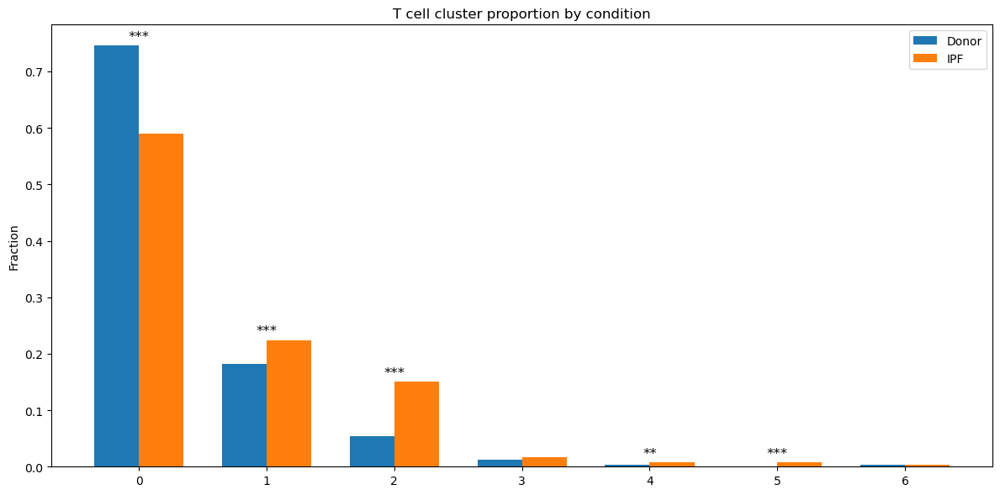

In [220]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(12, 6))
x = np.arange(len(df_result))
width = 0.35

# Bar plot
plt.bar(x - width/2, df_result['donor_fraction'], width, label='Donor')
plt.bar(x + width/2, df_result['ipf_fraction'], width, label='IPF')

# X축 설정
plt.xticks(x, df_result['cluster'])
plt.ylabel('Fraction')
plt.title('T cell cluster proportion by condition')
plt.legend()

# p-value 별로 * 표시
for i, pval in enumerate(df_result['p_value']):
    if pval < 0.001:
        stars = '***'
    elif pval < 0.01:
        stars = '**'
    elif pval < 0.05:
        stars = '*'
    else:
        stars = ''
    
    if stars:
        max_height = max(df_result['donor_fraction'][i], df_result['ipf_fraction'][i])
        plt.text(x[i], max_height + 0.005, stars, ha='center', va='bottom', fontsize=12, color='black')

plt.tight_layout()
plt.show()

In [221]:
adata_CD4.obs.to_csv("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_IPF_CD4_obs.csv")

In [222]:
adata_CD4.write("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_IPF_CD4_002.h5ad")

In [61]:
senescence_genes = [
    "BMP8B","CCL16","CCL23","CCL5","CLCF1","CTSC","CTSD","FGL2","FNDC3B",
    "BMP2","ADAM8","ADAMTS1","COLQ","COLGALT2","TNF","PRSS30P","PRSS23",
    "PLG","CKLF","CPD","CTSW","IRAK2","PDGFD","TNFSF10","TNFSF14",
    "TNFSF4","XCL1","COL15A1","GSAP","IL18","IRF6","ADAM28","COL13A1",
    "MPPE1","CTRC","GNAL","NPEPL1","PTGS1","KRT86","ADAM22","AMZ2P1",
    "KRT81","XPNPEP1","CARD11","CASP7","IFNL1","TGFB3","ADAM10",
    "KRT73","KRT72","KLKB1","KLK12","KLK1"
]

In [88]:
adata_CD4.uns['leiden_9_colors']=['#1f77b4','#17becf', '#279e68','#aa40fc', '#d62728', '#8c564b',
       '#e377c2', '#b5bd61','#ff7f0e', '#aec7e8', '#ffbb78', '#98df8a'] 

In [62]:
sc.tl.score_genes(adata_CD4, gene_list=senescence_genes, score_name="senescence_score")

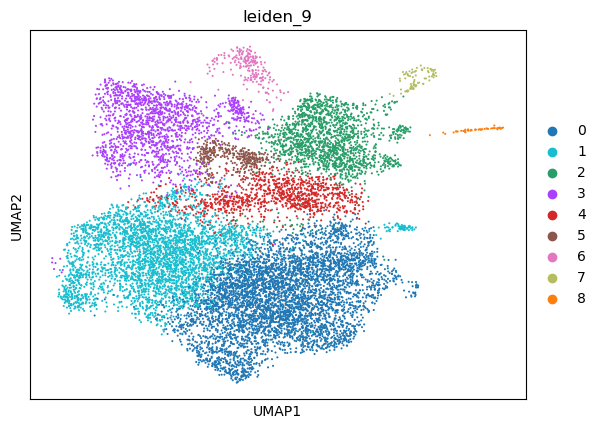

In [89]:
sc.pl.umap(adata_CD4, color = "leiden_9")

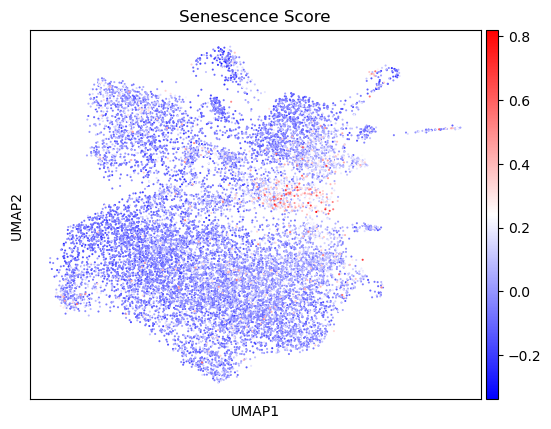

In [137]:
sc.pl.umap(adata_CD4, color='senescence_score', cmap='bwr', title='Senescence Score')

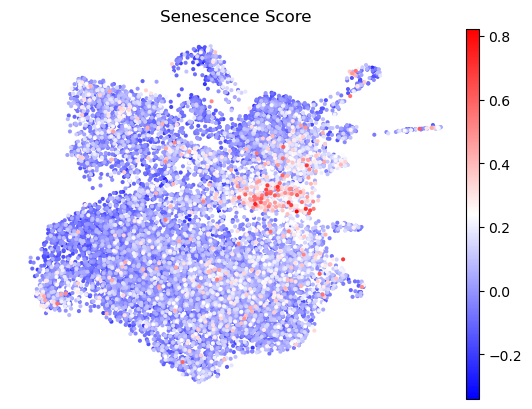

In [140]:
sc.pl.umap(
    adata_CD4,
    color='senescence_score',
    cmap='bwr',        # 🔥 낮: 파랑, 높: 빨강
    title='Senescence Score',
    size=35,           # 🔍 점 크게
    frameon=False
)

In [94]:
sc.pl.umap(
    adata_CD4,
    color='senescence_score',
    frameon=False,
    title='SASP_score',
    cmap='viridis',
    size=10,
    show=False,        # 이걸 False로 해야 plt.savefig()가 동작
    return_fig=True    # <- 중요: 그림 객체 반환
)
# 직접 저장
plt.savefig("/home/jaehyunchoi/bystander_collaboration/IPF_data/analysis/figures/SASP_GSEA/Lung_CD4_SASP_AUCscore.pdf", bbox_inches='tight', dpi=300)
plt.close()

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 20 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'P', 'S', 'c', 'e', 'eight', 'four', 'minus', 'nonmarkingreturn', 'o', 'period', 'r', 's', 'six', 'space', 'two', 'underscore', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 21, 23, 25, 27, 36, 51, 54, 66, 70, 72, 82, 85, 86, 3228]
Closed glyph list over 'MATH': 20 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'P', 'S', 'c', 'e', 'eight', 'four', 'minus', 'nonmarkingreturn', 'o', 'period', 'r', 's', 'six', 'space', 'two', 'underscore', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 21, 23, 25, 27, 36, 51, 54, 66, 70, 72, 82, 85, 86, 3228]
Closing glyph list over 'GSUB': 20 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'P', 'S', 'c', 'e', 'eight', 'four', 'minus', 'nonmarkingreturn', 'o', 'period', 'r', 's', 'six', 'space', 'two', 'underscore', '

In [91]:
sc.pl.umap(
    adata_CD4,
    color='leiden_9',
    frameon=False,
    title='SASP_score',
    #cmap='Reds',
    size=10,
    show=False,        # 이걸 False로 해야 plt.savefig()가 동작
    return_fig=True    # <- 중요: 그림 객체 반환
)
# 직접 저장
plt.savefig("/home/jaehyunchoi/bystander_collaboration/IPF_data/analysis/figures/SASP_GSEA/Lung_CD4_9cluster_UMAP.pdf", bbox_inches='tight', dpi=300)
plt.close()

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 22 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'P', 'S', 'c', 'e', 'eight', 'five', 'four', 'nonmarkingreturn', 'o', 'one', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'underscore', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 36, 51, 54, 66, 70, 72, 82, 85, 86]
Closed glyph list over 'MATH': 22 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'P', 'S', 'c', 'e', 'eight', 'five', 'four', 'nonmarkingreturn', 'o', 'one', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'underscore', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 36, 51, 54, 66, 70, 72, 82, 85, 86]
Closing glyph list over 'GSUB': 22 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'P', 'S', 'c', 'e', 'eight', 'five', 'four', 'nonmarkingreturn', 'o', 'one', 'r', 's', 's

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

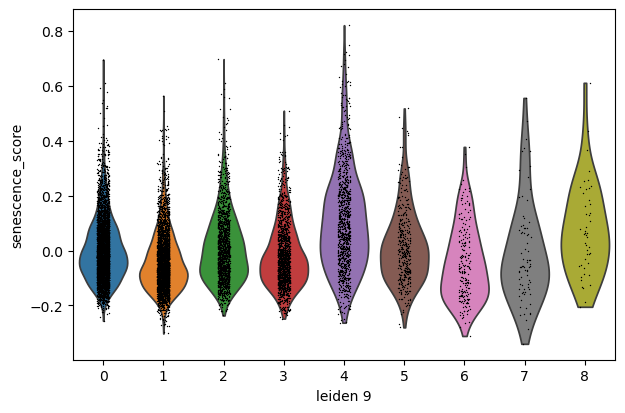

In [96]:
sc.pl.violin(adata_CD4, keys='senescence_score',groupby='leiden_9')

In [103]:
from scipy.stats import ranksums
import numpy as np

# 클러스터 정보
score = adata_CD4.obs['senescence_score']
group = adata_CD4.obs['leiden_9']

# 비교할 그룹 정의
score_4 = score[group == '4']
score_others = score[group != '4']

# Wilcoxon rank-sum test
stat, pval = ranksums(score_4, score_others)
print(f"Cluster 4 vs Others - p-value: {pval:.4e}")

Cluster 4 vs Others - p-value: 5.3694e-99


In [125]:
# 비교할 그룹 정의
score_4 = score[group == '4']
score_2 = score[group == '2']
score_0 = score[group == '0']

# Wilcoxon rank-sum test
stat2, pval2 = ranksums(score_4, score_2)
print(f"Cluster 4 vs Cluster 2 - p-value: {pval2:.4e}")

Cluster 4 vs Cluster 2 - p-value: 1.6296e-43


In [126]:
# 비교할 그룹 정의
score_4 = score[group == '4']
score_2 = score[group == '2']
score_0 = score[group == '0']

# Wilcoxon rank-sum test
stat0, pval0 = ranksums(score_4, score_0)
print(f"Cluster 4 vs Cluster 0 - p-value: {pval0:.4e}")

Cluster 4 vs Cluster 0 - p-value: 6.8407e-68


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

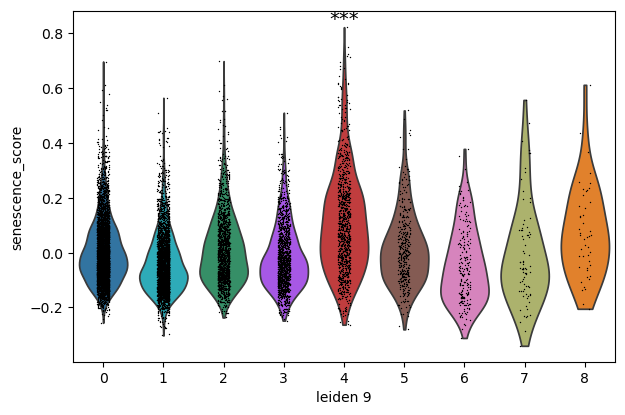

In [128]:
# 별 개수 설정
if pval < 0.001:
    stars = '***'
elif pval < 0.01:
    stars = '**'
elif pval < 0.05:
    stars = '*'
else:
    stars = 'ns'
palette = ['#1f77b4','#17becf', '#279e68','#aa40fc', '#d62728', '#8c564b',
       '#e377c2', '#b5bd61','#ff7f0e', '#aec7e8', '#ffbb78', '#98df8a'] 

sc.pl.violin(
    adata_CD4,
    keys='senescence_score',
    groupby='leiden_9',
    #ax=axs[i],
    palette = palette,
    show=False,
    stripplot=True,
    jitter=True
)
#fig.set_size_inches(6, 12)
# 별표 추가 (y 위치는 적절히 조정)
plt.text(x=4, y=score.max() + 0.01, s=stars, ha='center', fontsize=14)
plt.tight_layout()
plt.savefig("/home/jaehyunchoi/bystander_collaboration/IPF_data/analysis/figures/SASP_GSEA/IPF_CD4_SASP_violinplot.pdf", bbox_inches='tight', dpi=300)
plt.show()

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

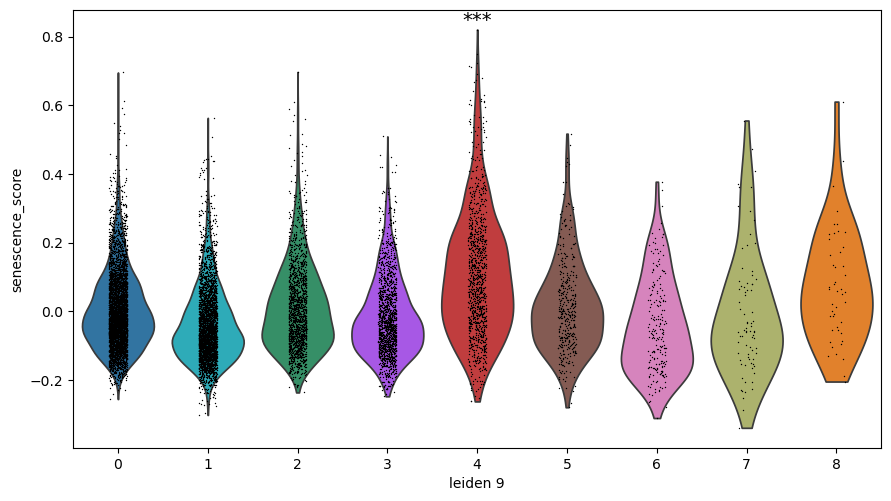

In [133]:
# 바이올린 플롯 그리기
sc.pl.violin(
    adata_CD4,
    keys='senescence_score',
    groupby='leiden_9',
    palette=palette,
    stripplot=True,
    jitter=True,
    show=False  # ← 중요!
)

# 현재 axis와 figure 가져오기
ax = plt.gca()
fig = plt.gcf()

# 별표 추가 (클러스터 4 기준)
score = adata_CD4.obs['senescence_score']
ax.text(x=4, y=score.max() + 0.01, s=stars, ha='center', fontsize=14)

# 레이아웃 조정 및 저장
fig.set_size_inches(12, 6)  # 필요 시 크기 조정
plt.tight_layout()
fig.savefig("/home/jaehyunchoi/bystander_collaboration/IPF_data/analysis/figures/SASP_GSEA/IPF_CD4_SASP_violinplot.pdf", bbox_inches='tight', dpi=300)
plt.show()

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

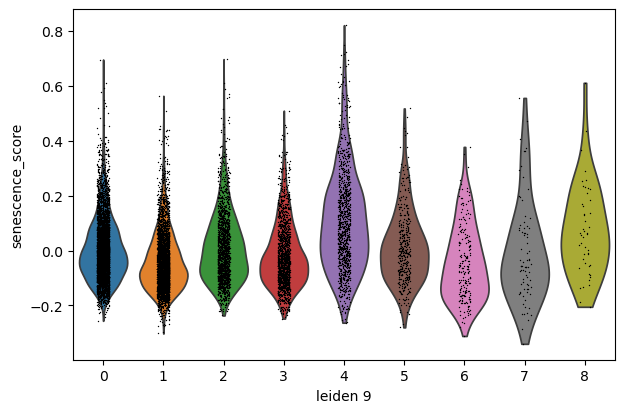

In [102]:
palette = adata_CD4.uns['leiden_9_colors']
#fig, axs = plt.subplots(n_genes, 1, figsize=(6, 1.8 * n_genes))  # 세로 크기를 줄임


sc.pl.violin(
    adata_CD4,
    keys='senescence_score',
    groupby='leiden_9',
    #ax=axs[i],
    palette = palette,
    show=False,
    stripplot=True,
    jitter=True
)

plt.tight_layout()
plt.savefig("/home/jaehyunchoi/bystander_collaboration/IPF_data/analysis/figures/SASP_GSEA/IPF_CD4_SASP_violinplot.pdf", bbox_inches='tight', dpi=300)
plt.show()

# Age comparison analysis

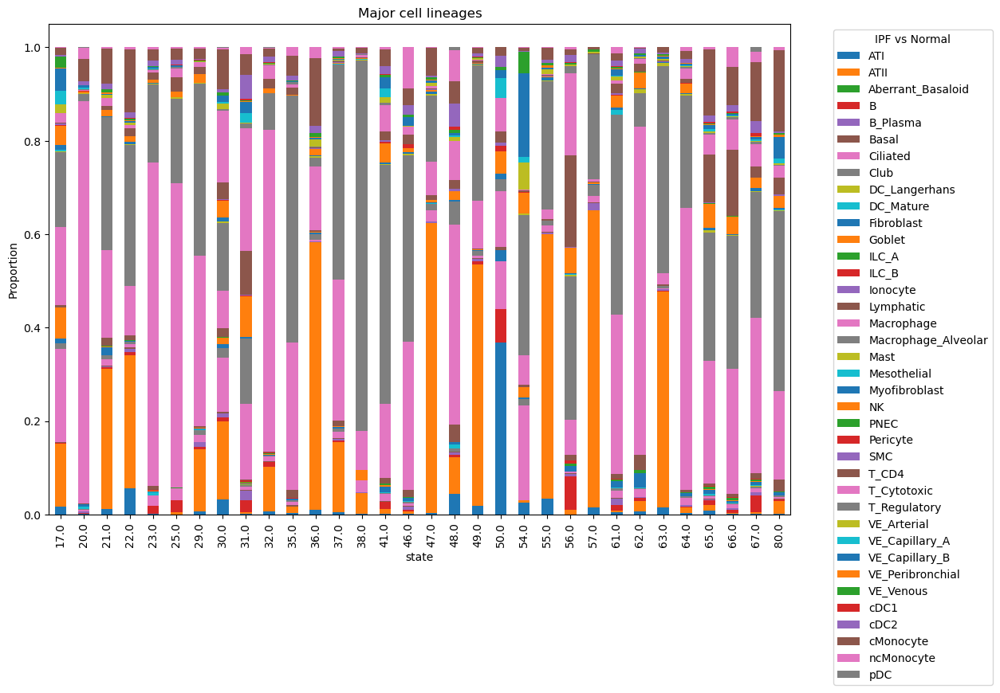

In [52]:
# Make Stacked bargraph for the comparison of cluster compositions
cluster_labels = adata_IPF_healthy.obs['celltypist_IPF']
batch_labels = adata_IPF_healthy.obs['Age']
crosstab = pd.crosstab(batch_labels, cluster_labels, normalize='index')

import seaborn as sns
import matplotlib.pyplot as plt


# 그래프 그리기
crosstab.plot(kind='bar', stacked=True, figsize=(12, 8))  # color=... 도 추가 가능

# 그래프 설정
plt.title('Major cell lineages')
plt.ylabel('Proportion')
plt.xlabel('state')
plt.legend(title='IPF vs Normal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

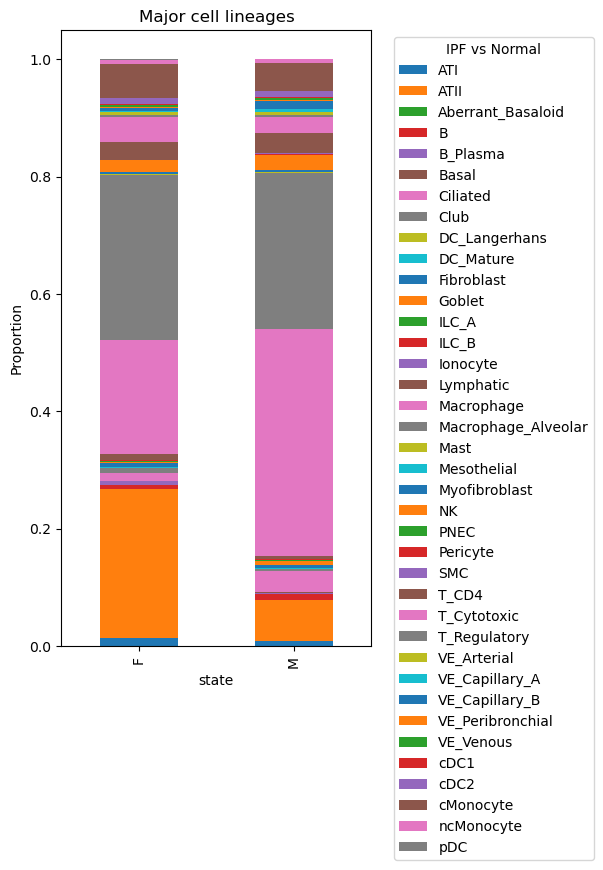

In [113]:
# Make Stacked bargraph for the comparison of cluster compositions
cluster_labels = adata_IPF_healthy.obs['celltypist_IPF']
batch_labels = adata_IPF_healthy.obs['Gender']
crosstab = pd.crosstab(batch_labels, cluster_labels, normalize='index')

import seaborn as sns
import matplotlib.pyplot as plt


# 그래프 그리기
crosstab.plot(kind='bar', stacked=True, figsize=(4, 8))  # color=... 도 추가 가능

# 그래프 설정
plt.title('Major cell lineages')
plt.ylabel('Proportion')
plt.xlabel('state')
plt.legend(title='IPF vs Normal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

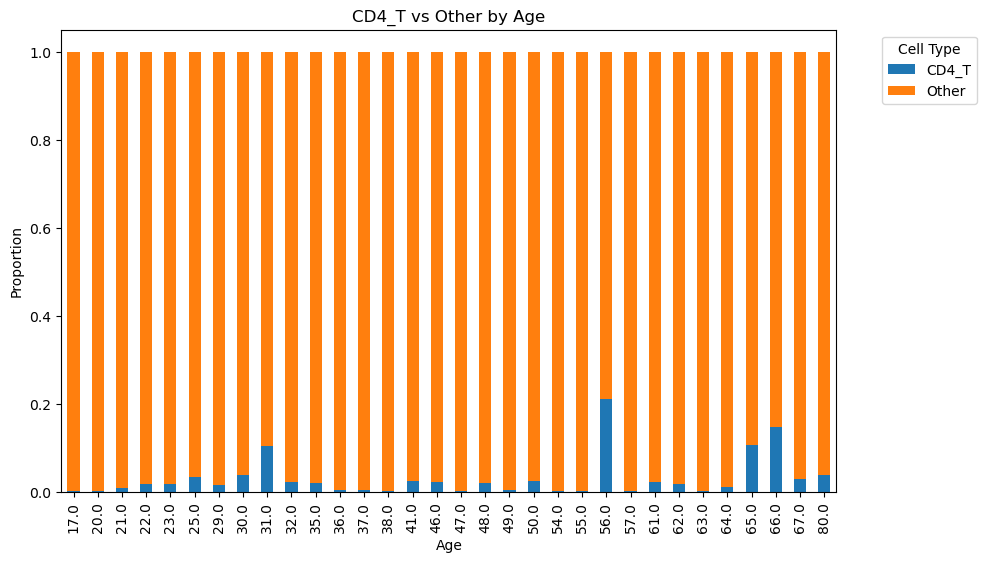

In [98]:
df = adata_IPF_healthy.obs.copy()

df['celltype_group'] = df['celltypist_IPF'].apply(
    lambda x: "CD4_T" if x in ["T_CD4", "T_Regulatory"] else "Other"
)

crosstab = pd.crosstab(df['Age'], df['celltype_group'], normalize='index')

# ✅ 4. Stacked Bar plot
crosstab.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('CD4_T vs Other by Age')
plt.ylabel('Proportion')
plt.xlabel('Age')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

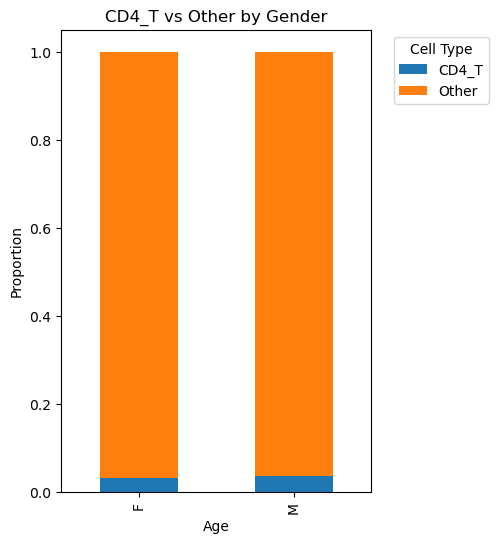

In [114]:
df = adata_IPF_healthy.obs.copy()

df['celltype_group'] = df['celltypist_IPF'].apply(
    lambda x: "CD4_T" if x in ["T_CD4", "T_Regulatory"] else "Other"
)

crosstab = pd.crosstab(df['Gender'], df['celltype_group'], normalize='index')

# ✅ 4. Stacked Bar plot
crosstab.plot(kind='bar', stacked=True, figsize=(4, 6))

plt.title('CD4_T vs Other by Gender')
plt.ylabel('Proportion')
plt.xlabel('Age')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

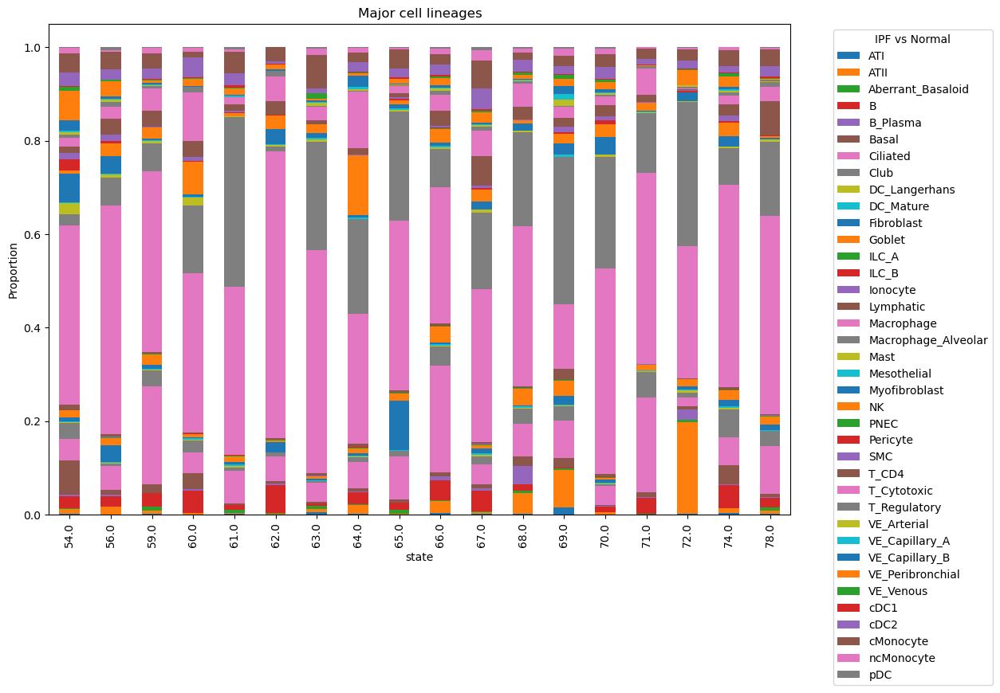

In [76]:
# Make Stacked bargraph for the comparison of cluster compositions
cluster_labels = adata_IPF_IPF.obs['celltypist_IPF']
batch_labels = adata_IPF_IPF.obs['Age']
crosstab = pd.crosstab(batch_labels, cluster_labels, normalize='index')

import seaborn as sns
import matplotlib.pyplot as plt


# 그래프 그리기
crosstab.plot(kind='bar', stacked=True, figsize=(12, 8))  # color=... 도 추가 가능

# 그래프 설정
plt.title('Major cell lineages')
plt.ylabel('Proportion')
plt.xlabel('state')
plt.legend(title='IPF vs Normal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

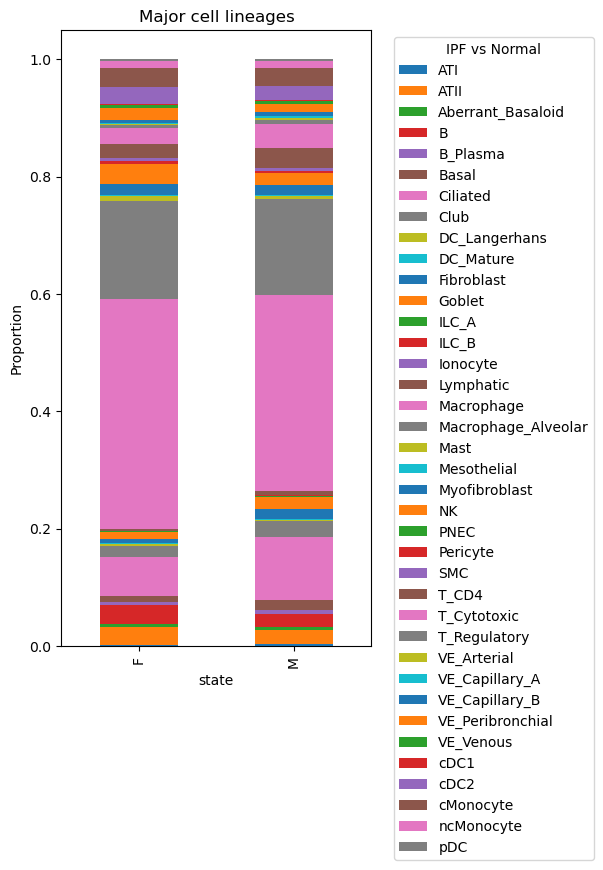

In [116]:
# Make Stacked bargraph for the comparison of cluster compositions
cluster_labels = adata_IPF_IPF.obs['celltypist_IPF']
batch_labels = adata_IPF_IPF.obs['Gender']
crosstab = pd.crosstab(batch_labels, cluster_labels, normalize='index')

import seaborn as sns
import matplotlib.pyplot as plt


# 그래프 그리기
crosstab.plot(kind='bar', stacked=True, figsize=(4, 8))  # color=... 도 추가 가능

# 그래프 설정
plt.title('Major cell lineages')
plt.ylabel('Proportion')
plt.xlabel('state')
plt.legend(title='IPF vs Normal', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

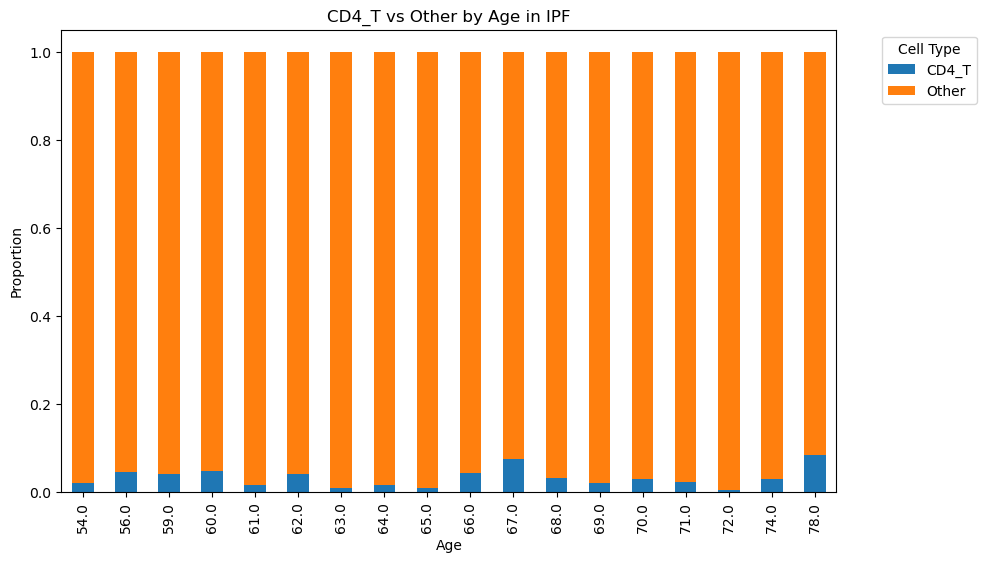

In [99]:
df = adata_IPF_IPF.obs.copy()

df['celltype_group'] = df['celltypist_IPF'].apply(
    lambda x: "CD4_T" if x in ["T_CD4", "T_Regulatory"] else "Other"
)

crosstab = pd.crosstab(df['Age'], df['celltype_group'], normalize='index')

# ✅ 4. Stacked Bar plot
crosstab.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('CD4_T vs Other by Age in IPF')
plt.ylabel('Proportion')
plt.xlabel('Age')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

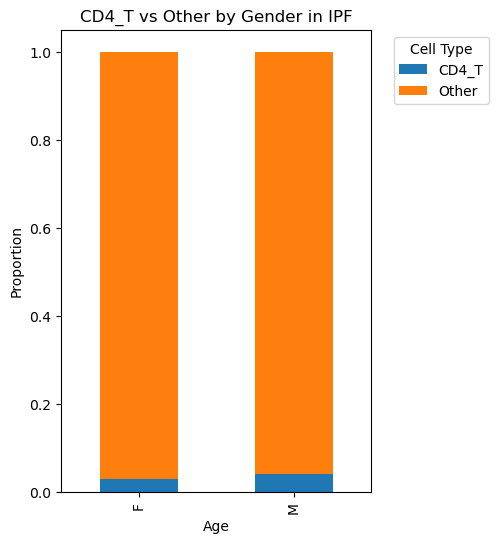

In [117]:
df = adata_IPF_IPF.obs.copy()

df['celltype_group'] = df['celltypist_IPF'].apply(
    lambda x: "CD4_T" if x in ["T_CD4", "T_Regulatory"] else "Other"
)

crosstab = pd.crosstab(df['Gender'], df['celltype_group'], normalize='index')

# ✅ 4. Stacked Bar plot
crosstab.plot(kind='bar', stacked=True, figsize=(4, 6))

plt.title('CD4_T vs Other by Gender in IPF')
plt.ylabel('Proportion')
plt.xlabel('Age')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [18]:
# age - Pd-1 CD4 T cell correlation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

In [5]:
adata_IPF

AnnData object with n_obs × n_vars = 385988 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_IPF_colors', 'hvg', 'journal_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [9]:
adata_IPF.obs['T_ratio']=adata_CD4.obs['leiden_9']
adata_IPF.obs['T_ratio'].value_counts()

T_ratio
0    4928
1    3578
2    1687
3    1547
4    1026
5     387
6     208
7      79
8      47
Name: count, dtype: int64

In [22]:
adata_IPF_healthy.write("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_IPF_healthy_001.h5ad")
adata_IPF_IPF.write("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_IPF_IPF_001.h5ad")

In [2]:
adata_IPF_healthy=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_IPF_healthy_001.h5ad")
adata_IPF_IPF=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_IPF_IPF_001.h5ad")

In [3]:
adata_IPF_healthy

AnnData object with n_obs × n_vars = 170540 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age', 'T_ratio'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_IPF_colors', 'hvg', 'journal_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
adata_IPF_healthy.obs['Age'].value_counts()

Age
32.0    19302
41.0    15055
29.0    14305
21.0    12149
30.0    10414
65.0    10110
66.0    10025
47.0     7467
22.0     6090
49.0     6037
63.0     5084
57.0     4993
64.0     4541
62.0     4028
55.0     3772
67.0     3460
80.0     3303
40.0     2647
56.0     2622
17.0     2552
61.0     2287
36.0     2218
38.0     2195
35.0     2166
23.0     2049
31.0     1910
54.0     1509
37.0     1268
48.0     1163
20.0      982
25.0      700
46.0      477
50.0      166
Name: count, dtype: int64

In [26]:
adata_IPF_healthy_sub = adata_IPF_healthy[~adata_IPF_healthy.obs['Age'].isin([50.0])].copy()
adata_IPF_healthy_sub

AnnData object with n_obs × n_vars = 170374 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age', 'T_ratio'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_IPF_colors', 'hvg', 'journal_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [4]:
age = adata_IPF_healthy.obs['Age']
cluster = adata_IPF_healthy.obs['T_ratio']
age = pd.to_numeric(age, errors='coerce')
df = pd.DataFrame({'age': age, 'cluster': cluster})
df['is_cluster4'] = (df['cluster'] == '4').astype(int)

In [27]:
age = adata_IPF_healthy_sub.obs['Age']
cluster = adata_IPF_healthy_sub.obs['T_ratio']
age = pd.to_numeric(age, errors='coerce')
df = pd.DataFrame({'age': age, 'cluster': cluster})
df['is_cluster4'] = (df['cluster'] == '4').astype(int)

In [5]:
cluster4_ratio = df.groupby('age')['is_cluster4'].mean().reset_index()
cluster4_ratio.rename(columns={'is_cluster4': 'cluster4_ratio'}, inplace=True)

print(cluster4_ratio.head())

    age  cluster4_ratio
0  17.0        0.000000
1  20.0        0.000000
2  21.0        0.000576
3  22.0        0.000000
4  23.0        0.000000


In [28]:
cluster4_ratio = df.groupby('age')['is_cluster4'].mean().reset_index()
cluster4_ratio.rename(columns={'is_cluster4': 'cluster4_ratio'}, inplace=True)

print(cluster4_ratio.head())

    age  cluster4_ratio
0  17.0        0.000000
1  20.0        0.000000
2  21.0        0.000576
3  22.0        0.000000
4  23.0        0.000000


In [28]:
R, pval = pearsonr(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'])
print(f"Pearson R = {R:.3f}, p-value = {pval:.3e}")

Pearson R = 0.064, p-value = 7.248e-01


In [29]:
R, pval = pearsonr(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'])
print(f"Pearson R = {R:.3f}, p-value = {pval:.3e}")

Pearson R = 0.030, p-value = 8.722e-01


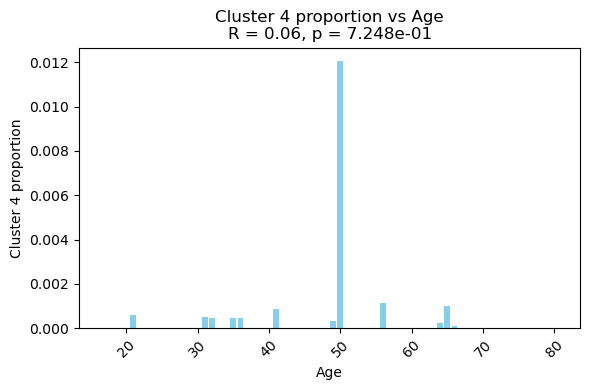

In [29]:
plt.figure(figsize=(6,4))
plt.bar(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'], color='skyblue')
plt.xlabel("Age")
plt.ylabel("Cluster 4 proportion")
plt.title(f"Cluster 4 proportion vs Age\nR = {R:.2f}, p = {pval:.3e}")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

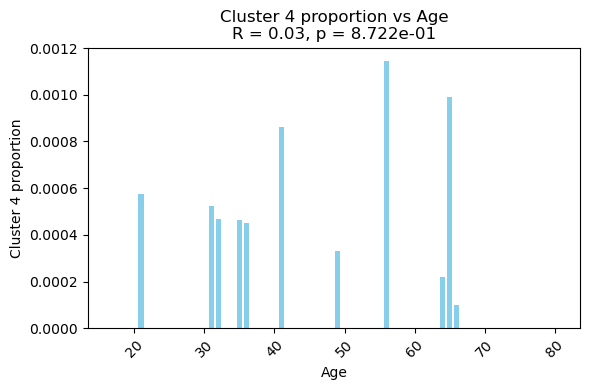

In [30]:
plt.figure(figsize=(6,4))
plt.bar(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'], color='skyblue')
plt.xlabel("Age")
plt.ylabel("Cluster 4 proportion")
plt.title(f"Cluster 4 proportion vs Age\nR = {R:.2f}, p = {pval:.3e}")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [40]:
adata_IPF_healthy_sub = adata_IPF_healthy[adata_IPF_healthy.obs['Age'] >= 54].copy()

In [9]:
adata_IPF_healthy

AnnData object with n_obs × n_vars = 170540 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age', 'T_ratio'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_IPF_colors', 'hvg', 'journal_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [11]:
adata_IPF_healthy_sub = adata_IPF_healthy[adata_IPF_healthy.obs['Age'] != 49].copy()

In [12]:
adata_IPF_healthy_sub

AnnData object with n_obs × n_vars = 164503 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age', 'T_ratio'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_IPF_colors', 'hvg', 'journal_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [36]:
age = adata_IPF_healthy_sub.obs['Age']
cluster = adata_IPF_healthy_sub.obs['T_ratio']
age = pd.to_numeric(age, errors='coerce')
df = pd.DataFrame({'age': age, 'cluster': cluster})
df['is_cluster4'] = (df['cluster'] == '4').astype(int)

cluster4_ratio = df.groupby('age')['is_cluster4'].mean().reset_index()
cluster4_ratio.rename(columns={'is_cluster4': 'cluster4_ratio'}, inplace=True)

print(cluster4_ratio.head())

R, pval = pearsonr(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'])
print(f"Pearson R = {R:.3f}, p-value = {pval:.3e}")

    age  cluster4_ratio
0  54.0        0.000000
1  55.0        0.000000
2  56.0        0.001144
3  57.0        0.000000
4  61.0        0.000000
Pearson R = -0.134, p-value = 6.771e-01


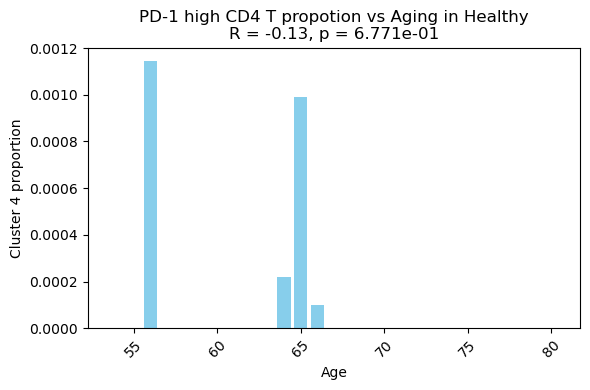

In [37]:
plt.figure(figsize=(6,4))
plt.bar(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'], color='skyblue')
plt.xlabel("Age")
plt.ylabel("Cluster 4 proportion")
plt.title(f"PD-1 high CD4 T propotion vs Aging in Healthy\nR = {R:.2f}, p = {pval:.3e}")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

    age  cluster4_ratio
0  54.0        0.005304
1  56.0        0.004502
2  59.0        0.000111
3  60.0        0.001375
4  61.0        0.000000
Pearson R = -0.022, p-value = 9.297e-01


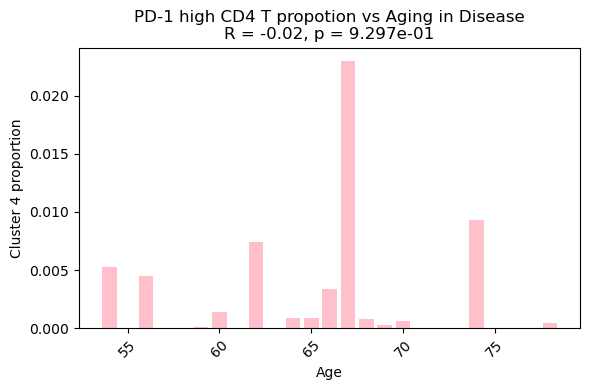

In [13]:
age = adata_IPF_IPF.obs['Age']
cluster = adata_IPF_IPF.obs['T_ratio']
age = pd.to_numeric(age, errors='coerce')
df = pd.DataFrame({'age': age, 'cluster': cluster})
df['is_cluster4'] = (df['cluster'] == '4').astype(int)

cluster4_ratio = df.groupby('age')['is_cluster4'].mean().reset_index()
cluster4_ratio.rename(columns={'is_cluster4': 'cluster4_ratio'}, inplace=True)

print(cluster4_ratio.head())

R, pval = pearsonr(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'])
print(f"Pearson R = {R:.3f}, p-value = {pval:.3e}")

plt.figure(figsize=(6,4))
plt.bar(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'], color='pink')
plt.xlabel("Age")
plt.ylabel("Cluster 4 proportion")
plt.title(f"PD-1 high CD4 T propotion vs Aging in Disease\nR = {R:.2f}, p = {pval:.3e}")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

  sample   age  cluster4_ratio
0   001C  17.0             NaN
1   001C  20.0             NaN
2   001C  21.0             NaN
3   001C  22.0             0.0
4   001C  23.0             NaN


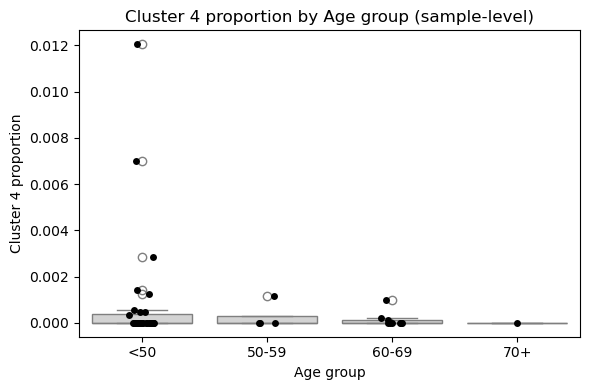

In [4]:
# 1) sample별 cluster4 비율 계산
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_healthy.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_healthy.obs['T_ratio'],
    'sample': adata_IPF_healthy.obs['sample']  # ✅ sample 정보
})

df['is_cluster4'] = (df['cluster'] == '4').astype(int)

sample_ratio = (
    df.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
print(sample_ratio.head())

# age를 그룹화 (예: 10단위 binning)
sample_ratio['age_group'] = pd.cut(
    sample_ratio['age'],
    bins=[0,50,60,70,100],
    labels=['<50','50-59','60-69','70+']
)

plt.figure(figsize=(6,4))
sns.boxplot(
    data=sample_ratio,
    x='age_group',
    y='cluster4_ratio',
    color='lightgray'
)
sns.stripplot(
    data=sample_ratio,
    x='age_group',
    y='cluster4_ratio',
    jitter=True,
    color='black',
    size=5
)
plt.title("Cluster 4 proportion by Age group (sample-level)")
plt.ylabel("Cluster 4 proportion")
plt.xlabel("Age group")
plt.tight_layout()
plt.show()

In [41]:
adata_IPF_healthy_sub

AnnData object with n_obs × n_vars = 55734 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age', 'T_ratio'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_IPF_colors', 'hvg', 'journal_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [10]:
adata_IPF_healthy_sub.obs['T_ratio'].value_counts()

T_ratio
0    2128
1     988
5     130
3     128
2      80
6      31
4      15
8      10
7       5
Name: count, dtype: int64

In [12]:
adata_IPF_IPF.obs['T_ratio'].value_counts()

T_ratio
0    2414
1    1953
3    1242
4     935
2     892
5     202
6     138
7      60
8      25
Name: count, dtype: int64

  sample   age  cluster4_ratio
0   003C  54.0             NaN
1   003C  55.0             NaN
2   003C  56.0             NaN
3   003C  57.0             NaN
4   003C  61.0             NaN


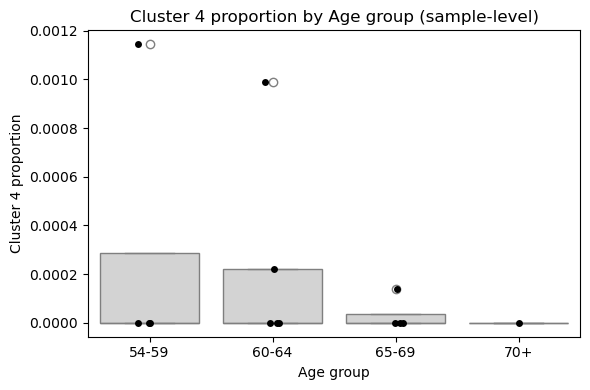

In [42]:
# 1) sample별 cluster4 비율 계산
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_healthy_sub.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_healthy_sub.obs['T_ratio'],
    'sample': adata_IPF_healthy_sub.obs['sample']  # ✅ sample 정보
})

df['is_cluster4'] = (df['cluster'] == '4').astype(int)

sample_ratio = (
    df.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
print(sample_ratio.head())

# age를 그룹화 (예: 10단위 binning)
sample_ratio['age_group'] = pd.cut(
    sample_ratio['age'],
    bins=[0,60,65,70,100],
    labels=['54-59','60-64','65-69','70+']
)

plt.figure(figsize=(6,4))
sns.boxplot(
    data=sample_ratio,
    x='age_group',
    y='cluster4_ratio',
    color='lightgray'
)
sns.stripplot(
    data=sample_ratio,
    x='age_group',
    y='cluster4_ratio',
    jitter=True,
    color='black',
    size=5
)
plt.title("Cluster 4 proportion by Age group (sample-level)")
plt.ylabel("Cluster 4 proportion")
plt.xlabel("Age group")
plt.tight_layout()
plt.show()

  sample   age  cluster4_ratio
0   010I  54.0             NaN
1   010I  56.0             NaN
2   010I  59.0             NaN
3   010I  60.0             NaN
4   010I  61.0             NaN


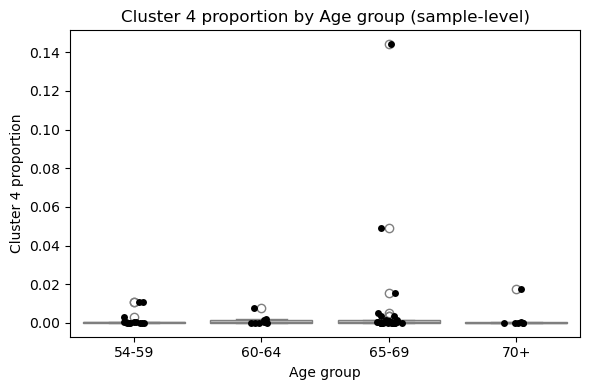

In [43]:
# 1) sample별 cluster4 비율 계산
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_IPF.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_IPF.obs['T_ratio'],
    'sample': adata_IPF_IPF.obs['sample']  # ✅ sample 정보
})

df['is_cluster4'] = (df['cluster'] == '4').astype(int)

sample_ratio = (
    df.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
print(sample_ratio.head())

# age를 그룹화 (예: 10단위 binning)
sample_ratio['age_group'] = pd.cut(
    sample_ratio['age'],
    bins=[0,60,65,70,100],
    labels=['54-59','60-64','65-69','70+']
)

plt.figure(figsize=(6,4))
sns.boxplot(
    data=sample_ratio,
    x='age_group',
    y='cluster4_ratio',
    color='lightgray'
)
sns.stripplot(
    data=sample_ratio,
    x='age_group',
    y='cluster4_ratio',
    jitter=True,
    color='black',
    size=5
)
plt.title("Cluster 4 proportion by Age group (sample-level)")
plt.ylabel("Cluster 4 proportion")
plt.xlabel("Age group")
plt.tight_layout()
plt.show()

In [81]:
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_healthy_sub.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_healthy_sub.obs['T_ratio'],
    'sample': adata_IPF_healthy_sub.obs['sample']  # ✅ sample 정보
})
df_T = df[df['cluster'].notna()]
df['is_cluster4'] = (df['cluster'] == '4').astype(int)
df_T['is_cluster4'] = (df_T['cluster'] == '4').astype(int)
sample_ratio = (
    df.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

sample_T_ratio = (
    df_T.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

cluster4_ratio = (
    df.groupby('age', as_index=False)['is_cluster4']
      .mean()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
R, pval = pearsonr(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'])
print(f"Pearson R = {R:.3f}, p-value = {pval:.3e}")

cluster4_Tratio = (
    df_T.groupby('age', as_index=False)['is_cluster4']
      .mean()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
R_T, pval_T = pearsonr(cluster4_Tratio['age'], cluster4_Tratio['cluster4_ratio'])
print(f"Pearson R = {R_T:.3f}, p-value = {pval_T:.3e}")

Pearson R = -0.134, p-value = 6.771e-01
Pearson R = 0.042, p-value = 8.958e-01


In [36]:
cluster4_ratio = (
    df.groupby('age', as_index=False)['is_cluster4']
      .mean()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
R, pval = pearsonr(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'])
print(f"Pearson R = {R:.3f}, p-value = {pval:.3e}")

Pearson R = -0.134, p-value = 6.771e-01


In [38]:
cluster4_Tratio = (
    df_T.groupby('age', as_index=False)['is_cluster4']
      .mean()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
R_T, pval_T = pearsonr(cluster4_Tratio['age'], cluster4_Tratio['cluster4_ratio'])
print(f"Pearson R = {R_T:.3f}, p-value = {pval_T:.3e}")

Pearson R = 0.042, p-value = 8.958e-01


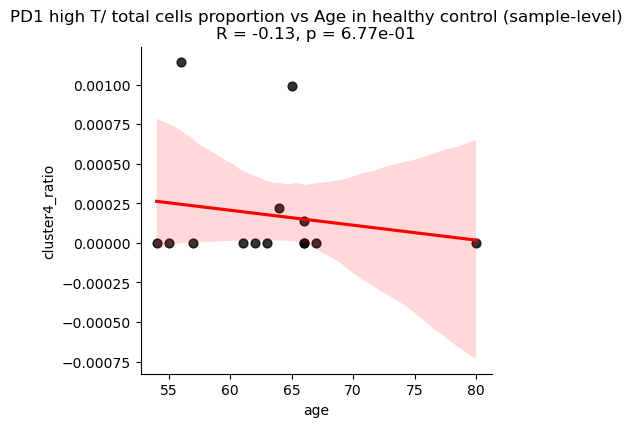

In [41]:
g = sns.lmplot(
    data=sample_ratio,
    x='age',
    y='cluster4_ratio',
    height=4, aspect=1.2,
    scatter_kws={'s':40, 'color':'black'},
    line_kws={'color':'red'}
)

# ✅ 타이틀에 R, p-value 표시
plt.title(f"PD1 high T/ total cells proportion vs Age in healthy control (sample-level)\nR = {R:.2f}, p = {pval:.2e}")

plt.show()

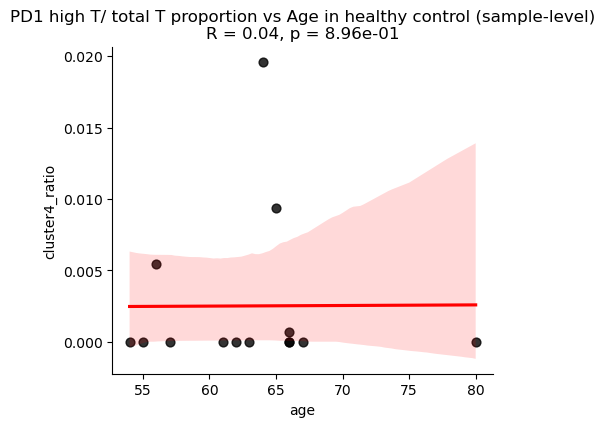

In [40]:
g = sns.lmplot(
    data=sample_T_ratio,
    x='age',
    y='cluster4_ratio',
    height=4, aspect=1.2,
    scatter_kws={'s':40, 'color':'black'},
    line_kws={'color':'red'}
)

# ✅ 타이틀에 R, p-value 표시
plt.title(f"PD1 high T/ total T proportion vs Age in healthy control (sample-level)\nR = {R_T:.2f}, p = {pval_T:.2e}")

plt.show()

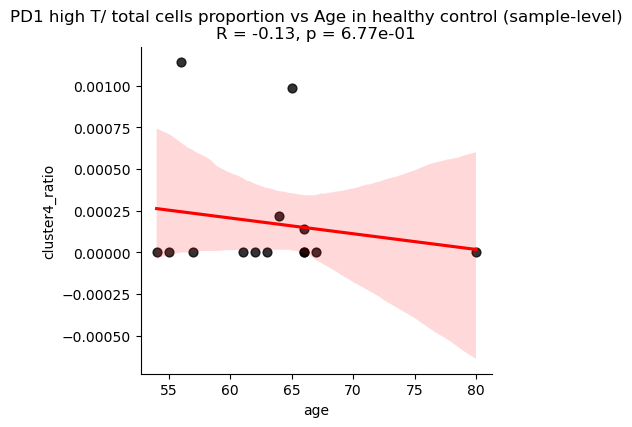

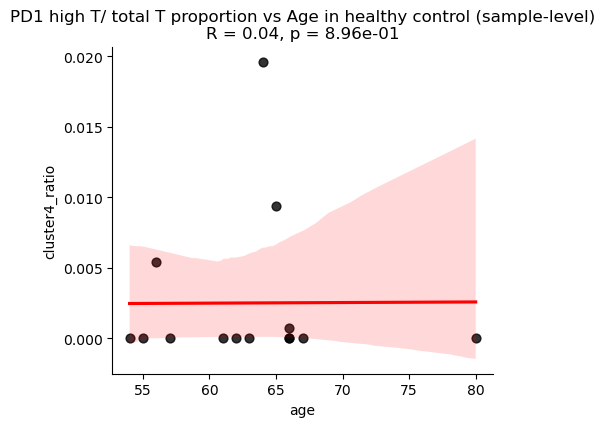

In [82]:
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_healthy_sub.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_healthy_sub.obs['T_ratio'],
    'sample': adata_IPF_healthy_sub.obs['sample']  # ✅ sample 정보
})
df_T = df[df['cluster'].notna()]
df['is_cluster4'] = (df['cluster'] == '4').astype(int)
df_T['is_cluster4'] = (df_T['cluster'] == '4').astype(int)
sample_ratio = (
    df.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

sample_T_ratio = (
    df_T.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

g = sns.lmplot(
    data=sample_ratio,
    x='age',
    y='cluster4_ratio',
    height=4, aspect=1.2,
    scatter_kws={'s':40, 'color':'black'},
    line_kws={'color':'red'}
)

# ✅ 타이틀에 R, p-value 표시
plt.title(f"PD1 high T/ total cells proportion vs Age in healthy control (sample-level)\nR = {R:.2f}, p = {pval:.2e}")

plt.show()

g = sns.lmplot(
    data=sample_T_ratio,
    x='age',
    y='cluster4_ratio',
    height=4, aspect=1.2,
    scatter_kws={'s':40, 'color':'black'},
    line_kws={'color':'red'}
)

# ✅ 타이틀에 R, p-value 표시
plt.title(f"PD1 high T/ total T proportion vs Age in healthy control (sample-level)\nR = {R_T:.2f}, p = {pval_T:.2e}")

plt.show()

In [83]:
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_IPF.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_IPF.obs['T_ratio'],
    'sample': adata_IPF_IPF.obs['sample']  # ✅ sample 정보
})
df_T = df[df['cluster'].notna()]
df['is_cluster4'] = (df['cluster'] == '4').astype(int)
df_T['is_cluster4'] = (df_T['cluster'] == '4').astype(int)
sample_ratio = (
    df.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

sample_T_ratio = (
    df_T.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

cluster4_ratio = (
    df.groupby('age', as_index=False)['is_cluster4']
      .mean()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
R, pval = pearsonr(cluster4_ratio['age'], cluster4_ratio['cluster4_ratio'])
print(f"Pearson R = {R:.3f}, p-value = {pval:.3e}")

cluster4_Tratio = (
    df_T.groupby('age', as_index=False)['is_cluster4']
      .mean()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
R_T, pval_T = pearsonr(cluster4_Tratio['age'], cluster4_Tratio['cluster4_ratio'])
print(f"Pearson R = {R_T:.3f}, p-value = {pval_T:.3e}")

Pearson R = -0.022, p-value = 9.297e-01
Pearson R = -0.117, p-value = 6.450e-01


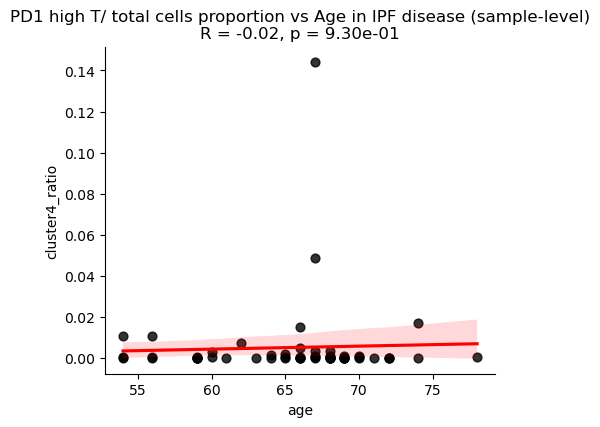

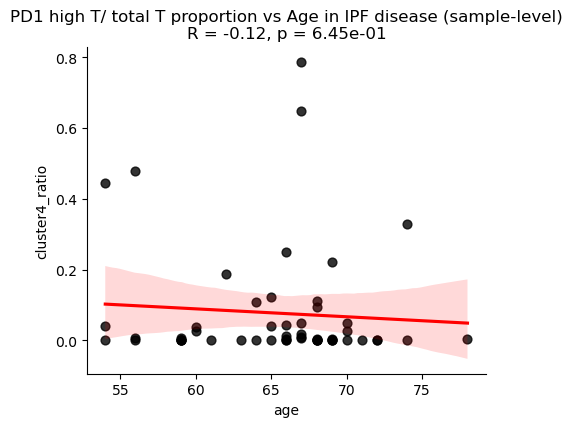

In [85]:
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_IPF.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_IPF.obs['T_ratio'],
    'sample': adata_IPF_IPF.obs['sample']  # ✅ sample 정보
})
df_T = df[df['cluster'].notna()]
df['is_cluster4'] = (df['cluster'] == '4').astype(int)
df_T['is_cluster4'] = (df_T['cluster'] == '4').astype(int)
sample_ratio = (
    df.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

sample_T_ratio = (
    df_T.groupby(['sample', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

g = sns.lmplot(
    data=sample_ratio,
    x='age',
    y='cluster4_ratio',
    height=4, aspect=1.2,
    scatter_kws={'s':40, 'color':'black'},
    line_kws={'color':'red'}
)

# ✅ 타이틀에 R, p-value 표시
plt.title(f"PD1 high T/ total cells proportion vs Age in IPF disease (sample-level)\nR = {R:.2f}, p = {pval:.2e}")

plt.show()

g = sns.lmplot(
    data=sample_T_ratio,
    x='age',
    y='cluster4_ratio',
    height=4, aspect=1.2,
    scatter_kws={'s':40, 'color':'black'},
    line_kws={'color':'red'}
)

# ✅ 타이틀에 R, p-value 표시
plt.title(f"PD1 high T/ total T proportion vs Age in IPF disease (sample-level)\nR = {R_T:.2f}, p = {pval_T:.2e}")

plt.show()

In [70]:
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_IPF.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_IPF.obs['T_ratio'],
    'sample': adata_IPF_IPF.obs['sample'],
    'state' : adata_IPF_IPF.obs['state']
})
df_T = df[df['cluster'].notna()]
df['is_cluster4'] = (df['cluster'] == '4').astype(int)
df_T['is_cluster4'] = (df_T['cluster'] == '4').astype(int)
sample_ratio = (
    df.groupby(['sample','state', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

sample_T_ratio = (
    df_T.groupby(['sample','state', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
sample_ratio = sample_ratio[sample_ratio['cluster4_ratio'].notna()]
sample_T_ratio = sample_T_ratio[sample_T_ratio['cluster4_ratio'].notna()]

In [69]:
IPF_df = pd.merge(sample_ratio, sample_T_ratio, on='sample', how='inner')
IPF_df.to_csv("/home/jaehyunchoi/bystander_collaboration/IPF_data/analysis/IPF_atlas_PD1Tproportion_IPF.csv", index=False)

In [74]:
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_healthy_sub.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_healthy_sub.obs['T_ratio'],
    'sample': adata_IPF_healthy_sub.obs['sample'],
    'state' : adata_IPF_healthy_sub.obs['state']
})
df_T = df[df['cluster'].notna()]
df['is_cluster4'] = (df['cluster'] == '4').astype(int)
df_T['is_cluster4'] = (df_T['cluster'] == '4').astype(int)
sample_ratio = (
    df.groupby(['sample','state', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

sample_T_ratio = (
    df_T.groupby(['sample','state', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
sample_ratio = sample_ratio[sample_ratio['cluster4_ratio'].notna()]
sample_T_ratio = sample_T_ratio[sample_T_ratio['cluster4_ratio'].notna()]

In [77]:
healthy_Sub_df = pd.merge(sample_ratio, sample_T_ratio, on='sample', how='inner')
healthy_Sub_df.to_csv("/home/jaehyunchoi/bystander_collaboration/IPF_data/analysis/IPF_atlas_PD1Tproportion_healthy_Sub.csv", index=False)

In [78]:
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_healthy.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_healthy.obs['T_ratio'],
    'sample': adata_IPF_healthy.obs['sample'],
    'state' : adata_IPF_healthy.obs['state']
})
df_T = df[df['cluster'].notna()]
df['is_cluster4'] = (df['cluster'] == '4').astype(int)
df_T['is_cluster4'] = (df_T['cluster'] == '4').astype(int)
sample_ratio = (
    df.groupby(['sample','state', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)

sample_T_ratio = (
    df_T.groupby(['sample','state', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
sample_ratio = sample_ratio[sample_ratio['cluster4_ratio'].notna()]
sample_T_ratio = sample_T_ratio[sample_T_ratio['cluster4_ratio'].notna()]

In [79]:
healthy_df = pd.merge(sample_ratio, sample_T_ratio, on='sample', how='inner')
healthy_df.to_csv("/home/jaehyunchoi/bystander_collaboration/IPF_data/analysis/IPF_atlas_PD1Tproportion_healthy.csv", index=False)

In [48]:
adata_IPF_IPF.obs

,nCount_RNA,nFeature_RNA,sample,state,journal,leiden,celltypist_atlas,celltypist_IPF,celltypist_PF,celltypist_Atlas,Gender,Age,T_ratio
AAACCTGAGCACCGCT-1-adata_GSM3489183,20272,3337,adata_GSM3489183,IPF,GSE122960,0,Alveolar macrophages,Macrophage_Alveolar,Macrophages,Alveolar macrophages,M,66.0,NaN
AAACCTGCACAGATTC-1-adata_GSM3489183,4279,1760,adata_GSM3489183,IPF,GSE122960,23,CD8 T cells,SMC,Smooth Muscle Cells,CD8 T cells,M,66.0,NaN
AAACCTGGTAAGGGCT-1-adata_GSM3489183,7210,1972,adata_GSM3489183,IPF,GSE122960,2,AT2,ATII,AT2,AT2,M,66.0,NaN
AAACCTGGTCAAACTC-1-adata_GSM3489183,13618,3212,adata_GSM3489183,IPF,GSE122960,8,DC2,Macrophage,Macrophages,DC2,M,66.0,NaN
AAACCTGGTGCAACGA-1-adata_GSM3489183,19636,3008,adata_GSM3489183,IPF,GSE122960,7,Monocyte-derived Mph,Macrophage,Macrophages,Monocyte-derived Mph,M,66.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
59I_TTTGGTTTCATCGGAT,41437,6962,59I,IPF,GSE136831,7,Non-classical monocytes,Macrophage,Macrophages,Non-classical monocytes,F,66.0,NaN
59I_TTTGTCAAGACCCACC,4826,2192,59I,IPF,GSE136831,11,NK cells,NK,NK Cells,NK cells,F,66.0,NaN
59I_TTTGTCAAGATGTTAG,10581,3349,59I,IPF,GSE136831,7,Non-classical monocytes,Macrophage,Macrophages,Non-classical monocytes,F,66.0,NaN
59I_TTTGTCACATTCTCAT,11092,3442,59I,IPF,GSE136831,8,Interstitial Mph perivascular,Macrophage,Macrophages,Interstitial Mph perivascular,F,66.0,NaN


In [51]:
df = pd.DataFrame({
    'sample': adata_IPF_IPF.obs['sample'],
    'state': adata_IPF_IPF.obs['state'],
    'age': pd.to_numeric(adata_IPF_IPF.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_IPF.obs['T_ratio']
})

df

,sample,state,age,cluster
AAACCTGAGCACCGCT-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN
AAACCTGCACAGATTC-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN
AAACCTGGTAAGGGCT-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN
AAACCTGGTCAAACTC-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN
AAACCTGGTGCAACGA-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN
...,...,...,...,...
59I_TTTGGTTTCATCGGAT,59I,IPF,66.0,NaN
59I_TTTGTCAAGACCCACC,59I,IPF,66.0,NaN
59I_TTTGTCAAGATGTTAG,59I,IPF,66.0,NaN
59I_TTTGTCACATTCTCAT,59I,IPF,66.0,NaN


In [52]:
df['is_cluster4'] = (df['cluster'] == '4').astype(int)
df['is_cluster4_noNaN'] = df.apply(
    lambda x: 1 if x['cluster'] == '4' else (0 if pd.notna(x['cluster']) else None),
    axis=1
)
df

,sample,state,age,cluster,is_cluster4,is_cluster4_noNaN
AAACCTGAGCACCGCT-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN,0,NaN
AAACCTGCACAGATTC-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN,0,NaN
AAACCTGGTAAGGGCT-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN,0,NaN
AAACCTGGTCAAACTC-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN,0,NaN
AAACCTGGTGCAACGA-1-adata_GSM3489183,adata_GSM3489183,IPF,66.0,NaN,0,NaN
...,...,...,...,...,...,...
59I_TTTGGTTTCATCGGAT,59I,IPF,66.0,NaN,0,NaN
59I_TTTGTCAAGACCCACC,59I,IPF,66.0,NaN,0,NaN
59I_TTTGTCAAGATGTTAG,59I,IPF,66.0,NaN,0,NaN
59I_TTTGTCACATTCTCAT,59I,IPF,66.0,NaN,0,NaN


In [53]:
summary = (
    df.groupby('sample')
      .agg(
          state=('state', 'first'),  # sample마다 같은 값이라고 가정
          age=('age', 'first'),      # sample마다 같은 값이라고 가정
          cluster4_prop_all=('is_cluster4', 'mean'),  # 전체 대비 비율
          cluster4_prop_noNaN=('is_cluster4_noNaN', 'mean')  # NaN 제외 비율
      )
      .reset_index()
)
summary

,sample,state,age,cluster4_prop_all,cluster4_prop_noNaN
0,010I,IPF,78.0,0.000411,0.004890
1,021I,IPF,69.0,0.000000,0.000000
2,022I,IPF,67.0,0.003510,0.048295
3,025I,IPF,65.0,0.000309,0.041667
4,29I,IPF,61.0,0.000000,0.000000
5,034I,IPF,54.0,0.010516,0.445545
6,040I,IPF,70.0,0.001212,0.025751
7,041I,IPF,59.0,0.000000,0.000000
8,47I,IPF,64.0,0.001624,0.108108
9,49I,IPF,66.0,0.015355,0.249123


In [2]:
adata_IPF=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_public_atlas_final.h5ad")
adata_IPF

AnnData object with n_obs × n_vars = 385988 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_IPF_colors', 'hvg', 'journal_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [3]:
adata_IPF_sub = adata_IPF[adata_IPF.obs['Age'] >= 54].copy()

In [4]:
adata_IPF_sub

AnnData object with n_obs × n_vars = 271182 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_IPF_colors', 'hvg', 'journal_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
adata_CD4=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_IPF_CD4_002.h5ad")

In [7]:
adata_IPF_sub.obs['T_ratio']=adata_CD4.obs['leiden_9']
adata_IPF_sub.obs['T_ratio'].value_counts()

T_ratio
0    4542
1    2941
3    1370
2     972
4     950
5     332
6     169
7      65
8      35
Name: count, dtype: int64

In [32]:
def pval_to_star(p):
    if pd.isna(p):
        return 'ns'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return 'ns'

  sample   age    state  cluster4_ratio
0   003C  54.0  Control             NaN
1   003C  54.0      IPF             NaN
2   003C  55.0  Control             NaN
3   003C  55.0      IPF             NaN
4   003C  56.0  Control             NaN


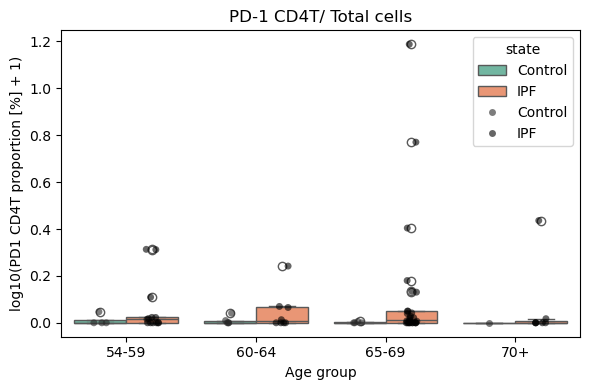

In [29]:
# 1) sample별 cluster4 비율 계산
df = pd.DataFrame({
    'age': pd.to_numeric(adata_IPF_sub.obs['Age'], errors='coerce'),
    'cluster': adata_IPF_sub.obs['T_ratio'],
    'sample': adata_IPF_sub.obs['sample'],
    'state': adata_IPF_sub.obs['state']
})

df['is_cluster4'] = (df['cluster'] == '4').astype(int)

sample_ratio = (
    df.groupby(['sample', 'age','state'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
print(sample_ratio.head())

# age를 그룹화 (예: 10단위 binning)
sample_ratio['age_group'] = pd.cut(
    sample_ratio['age'],
    bins=[0,60,65,70,100],
    labels=['54-59','60-64','65-69','70+']
)
sample_ratio['log_cluster4_ratio'] = np.log10(sample_ratio['cluster4_ratio'] * 100 + 1)
#sample_ratio['log_cluster4_ratio'] = sample_ratio['cluster4_ratio'] * 100

plt.figure(figsize=(6,4))
sns.boxplot(
    data=sample_ratio,
    x='age_group',
    y='log_cluster4_ratio',
    hue = 'state',
    palette = 'Set2'
)
sns.stripplot(
    data=sample_ratio,
    x='age_group',
    y='log_cluster4_ratio',
    hue='state',
    dodge=True,
    jitter=True,
    color='black',
    size=5,
    alpha = 0.6
)
plt.title("PD-1 CD4T/ Total cells")
plt.ylabel("log10(PD1 CD4T proportion [%] + 1)")
plt.xlabel("Age group")
plt.tight_layout()
plt.show()

In [27]:
import pandas as pd
import numpy as np
from scipy.stats import fisher_exact

df['age_group'] = pd.cut(
    df['age'],
    bins=[0, 60, 65, 70, 100],
    labels=['54-59','60-64','65-69','70+']
)

results = []
for age_bin, sub_df in df.groupby('age_group'):
    if sub_df.empty:
        continue

    # contingency table 계산
    table = (
        sub_df.groupby('state')['is_cluster4']
              .agg([np.sum, lambda x: (1 - x).sum()])  # cluster4 수, non-cluster4 수
              .rename(columns={'sum': 'cluster4', '<lambda_0>': 'not_cluster4'})
    )

    # state가 normal, disease 둘 다 있어야 검정 가능
    if set(['Control','IPF']).issubset(table.index):
        a, b = table.loc['Control', ['cluster4','not_cluster4']]
        c, d = table.loc['IPF', ['cluster4','not_cluster4']]

        # Fisher's exact test
        _, pval = fisher_exact([[a, b], [c, d]])
    else:
        pval = np.nan

    results.append({
        'age_group': age_bin,
        'pvalue': pval
    })

fisher_results = pd.DataFrame(results)
print(fisher_results)

  age_group        pvalue
0     54-59  1.465534e-06
1     60-64  1.679838e-09
2     65-69  1.844225e-33
3       70+  6.756450e-03


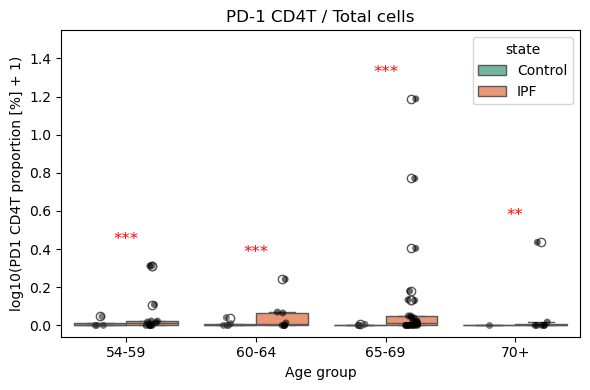

In [36]:
plt.figure(figsize=(6,4))
ax = sns.boxplot(
    data=sample_ratio,
    x='age_group',
    y='log_cluster4_ratio',
    hue='state',
    palette='Set2'
)

sns.stripplot(
    data=sample_ratio,
    x='age_group',
    y='log_cluster4_ratio',
    hue='state',
    dodge=True,
    jitter=True,
    color='black',
    size=5,
    alpha=0.6,
    legend=False  # legend 중복 제거
)

plt.title("PD-1 CD4T / Total cells")
plt.ylabel("log10(PD1 CD4T proportion [%] + 1)")
plt.xlabel("Age group")

# ✅ p-value → 별 변환 후 annotate
for i, row in fisher_results.iterrows():
    star = pval_to_star(row['pvalue'])
    if star == 'ns':  # ns는 안 그리고 싶으면 continue
        continue

    age_bin = row['age_group']

    # 현재 age_group 위치의 최대값 위에 텍스트 표시
    max_y = sample_ratio.loc[sample_ratio['age_group'] == age_bin, 'log_cluster4_ratio'].max()
    plt.text(
        x=i, 
        y=max_y + 0.1,  # 살짝 위로 올림
        s=star,
        ha='center', va='bottom', fontsize=12, color='red'
    )
current_ylim = plt.ylim()
plt.ylim(current_ylim[0], current_ylim[1] + 0.3)
plt.tight_layout()
plt.show()

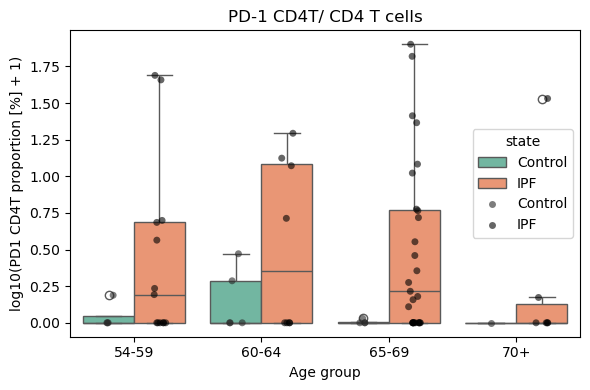

In [30]:
df_T = df[df['cluster'].notna()]
sample_T_ratio = (
    df_T.groupby(['sample','state', 'age'])['is_cluster4']
      .mean()
      .reset_index()
      .rename(columns={'is_cluster4': 'cluster4_ratio'})
)
# age를 그룹화 (예: 10단위 binning)
sample_T_ratio['age_group'] = pd.cut(
    sample_T_ratio['age'],
    bins=[0,60,65,70,100],
    labels=['54-59','60-64','65-69','70+']
)
sample_T_ratio['log_cluster4_ratio'] = np.log10(sample_T_ratio['cluster4_ratio'] * 100 + 1)
#sample_ratio['log_cluster4_ratio'] = sample_ratio['cluster4_ratio'] * 100

plt.figure(figsize=(6,4))
sns.boxplot(
    data=sample_T_ratio,
    x='age_group',
    y='log_cluster4_ratio',
    hue = 'state',
    palette = 'Set2'
)
sns.stripplot(
    data=sample_T_ratio,
    x='age_group',
    y='log_cluster4_ratio',
    hue='state',
    dodge=True,
    jitter=True,
    color='black',
    size=5,
    alpha = 0.6
)
plt.title("PD-1 CD4T/ CD4 T cells")
plt.ylabel("log10(PD1 CD4T proportion [%] + 1)")
plt.xlabel("Age group")
plt.tight_layout()
plt.show()

In [28]:
import pandas as pd
import numpy as np
from scipy.stats import fisher_exact

df_T['age_group'] = pd.cut(
    df['age'],
    bins=[0, 60, 65, 70, 100],
    labels=['54-59','60-64','65-69','70+']
)

results = []
for age_bin, sub_df in df_T.groupby('age_group'):
    if sub_df.empty:
        continue

    # contingency table 계산
    table = (
        sub_df.groupby('state')['is_cluster4']
              .agg([np.sum, lambda x: (1 - x).sum()])  # cluster4 수, non-cluster4 수
              .rename(columns={'sum': 'cluster4', '<lambda_0>': 'not_cluster4'})
    )

    # state가 normal, disease 둘 다 있어야 검정 가능
    if set(['Control','IPF']).issubset(table.index):
        a, b = table.loc['Control', ['cluster4','not_cluster4']]
        c, d = table.loc['IPF', ['cluster4','not_cluster4']]

        # Fisher's exact test
        _, pval = fisher_exact([[a, b], [c, d]])
    else:
        pval = np.nan

    results.append({
        'age_group': age_bin,
        'pvalue': pval
    })

fisher_results = pd.DataFrame(results)
print(fisher_results)

  age_group        pvalue
0     54-59  7.574407e-08
1     60-64  2.972240e-25
2     65-69  2.671123e-96
3       70+  3.384506e-03


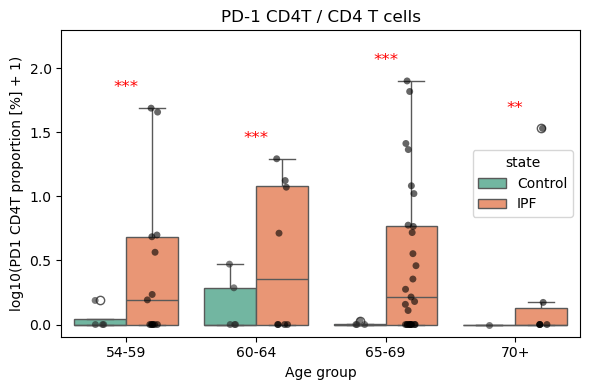

In [34]:
plt.figure(figsize=(6,4))
ax = sns.boxplot(
    data=sample_T_ratio,
    x='age_group',
    y='log_cluster4_ratio',
    hue='state',
    palette='Set2'
)

sns.stripplot(
    data=sample_T_ratio,
    x='age_group',
    y='log_cluster4_ratio',
    hue='state',
    dodge=True,
    jitter=True,
    color='black',
    size=5,
    alpha=0.6,
    legend=False  # legend 중복 제거
)

plt.title("PD-1 CD4T / CD4 T cells")
plt.ylabel("log10(PD1 CD4T proportion [%] + 1)")
plt.xlabel("Age group")

# ✅ p-value → 별 변환 후 annotate
for i, row in fisher_results.iterrows():
    star = pval_to_star(row['pvalue'])
    if star == 'ns':  # ns는 안 그리고 싶으면 continue
        continue

    age_bin = row['age_group']

    # 현재 age_group 위치의 최대값 위에 텍스트 표시
    max_y = sample_T_ratio.loc[sample_T_ratio['age_group'] == age_bin, 'log_cluster4_ratio'].max()
    plt.text(
        x=i, 
        y=max_y + 0.1,  # 살짝 위로 올림
        s=star,
        ha='center', va='bottom', fontsize=12, color='red'
    )
current_ylim = plt.ylim()
plt.ylim(current_ylim[0], current_ylim[1] + 0.3)
plt.tight_layout()
plt.show()

# AGE 53 cutoff analysis

In [29]:
adata_IPF=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_public_atlas_final.h5ad")
adata_IPF_sub = adata_IPF[adata_IPF.obs['Age'] >= 54].copy()
adata_CD4=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/Lung_IPF_CD4_002.h5ad")
adata_IPF_sub.obs['T_ratio']=adata_CD4.obs['leiden_9']
adata_IPF_sub.obs['T_ratio'].value_counts()

T_ratio
0    4542
1    2941
3    1370
2     972
4     950
5     332
6     169
7      65
8      35
Name: count, dtype: int64

In [3]:
adata_IPF_sub

AnnData object with n_obs × n_vars = 271182 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'leiden', 'celltypist_atlas', 'celltypist_IPF', 'celltypist_PF', 'celltypist_Atlas', 'Gender', 'Age'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltypist_IPF_colors', 'hvg', 'journal_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

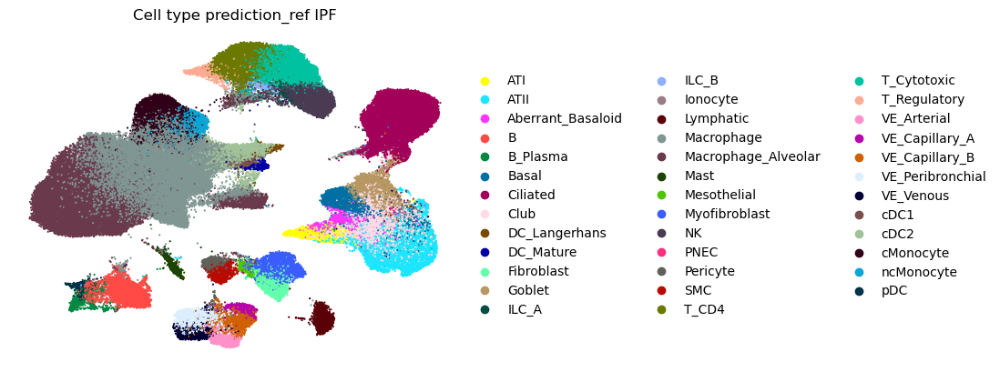

In [6]:
sc.pl.umap(
    adata_IPF_sub,
    color='celltypist_IPF',
    frameon=False,
    title='Cell type prediction_ref IPF',
    size=10
)

In [ ]:
adata_IPF_sub.obs['clustering'] = adata_IPF_sub.obs['celltypist_IPF']
adata_IPF_sub.obs['clustering'] = adata_IPF_sub.obs['clustering'].replace({
    'CCR6_high': 'C0 CCR6_high',
    'IFN-I_high': 'C1 IFN-I_high',
    'PD-1_high': 'C2 PD-1_high',
    'Resting': 'C3 Resting',
    'Th1-like': 'C4 Th1',
    'Th2-like': 'C5 pTh2',
    'Treg-like': 'C6 Treg',
    'Undefined': 'C7 proliferating'
})

sc.pl.umap(adata, color=['clustering'])

In [7]:
adata_IPF_sub.obs['celltypist_IPF'].value_counts()

celltypist_IPF
Macrophage             88875
Macrophage_Alveolar    51588
Ciliated               22055
ATII                   13626
cMonocyte              10546
T_Cytotoxic            10187
T_CD4                   9950
NK                      6757
B                       5930
cDC2                    5814
Club                    5563
Goblet                  4192
Myofibroblast           4022
VE_Peribronchial        3491
Fibroblast              3408
Basal                   3302
ncMonocyte              3156
VE_Capillary_B          2015
Lymphatic               1858
B_Plasma                1705
T_Regulatory            1426
Mast                    1291
VE_Arterial             1206
ATI                     1203
SMC                     1135
VE_Venous               1128
Pericyte                 850
Aberrant_Basaloid        821
VE_Capillary_A           725
pDC                      577
cDC1                     555
DC_Mature                535
DC_Langerhans            448
ILC_A                    443

                cluster  donor_fraction  ipf_fraction  odds_ratio  \
0                   ATI        0.008576      0.003365    2.562058   
1                  ATII        0.145279      0.025663    6.453345   
2     Aberrent_Basaloid        0.000000      0.000000         NaN   
3                     B        0.010102      0.024911    0.399441   
4              B_Plasma        0.004199      0.006828    0.613306   
5                 Basal        0.000700      0.015145    0.045535   
6              Ciliated        0.014587      0.098595    0.135338   
7                  Club        0.005311      0.024447    0.213066   
8         DC_Langerhans        0.000054      0.002065    0.026008   
9             DC_Mature        0.001023      0.002219    0.460414   
10           Fibroblast        0.007500      0.013878    0.536942   
11               Goblet        0.001525      0.019063    0.078600   
12                ILC_A        0.002907      0.001304    2.232175   
13                ILC_B        0.0

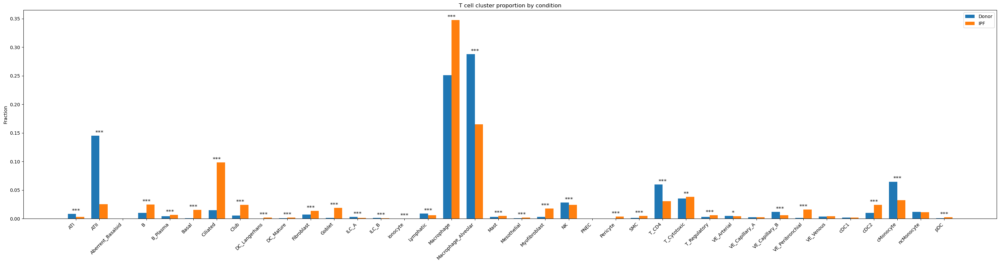

In [27]:
from scipy.stats import fisher_exact
import pandas as pd

# 상태 및 클러스터 정보
state = adata_IPF_sub.obs['state']
cluster = adata_IPF_sub.obs['celltypist_IPF']

# 분석할 cell type 리스트
selected_clusters1 = ['ATI', 'ATII', 'Aberrent_Basaloid','B' ,'B_Plasma', 'Basal',
'Ciliated', 'Club', 'DC_Langerhans','DC_Mature' ,'Fibroblast', 'Goblet',
'ILC_A', 'ILC_B', 'Ionocyte','Lymphatic' ,'Macrophage', 'Macrophage_Alveolar',
'Mast', 'Mesothelial', 'Myofibroblast','NK' ,'PNEC', 'Pericyte',
'SMC', 'T_CD4', 'T_Cytotoxic','T_Regulatory',
'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B','VE_Peribronchial' ,'VE_Venous',
'cDC1', 'cDC2', 'cMonocyte','ncMonocyte' ,'pDC']

results = []

for clus in selected_clusters1:
    # 각 조건별 개수 계산
    donor_in = ((state == "Control") & (cluster == clus)).sum()
    donor_out = ((state == "Control") & (cluster != clus)).sum()
    ipf_in = ((state == "IPF") & (cluster == clus)).sum()
    ipf_out = ((state == "IPF") & (cluster != clus)).sum()
    
    # 2x2 contingency table
    table = [[donor_in, donor_out], [ipf_in, ipf_out]]
    oddsratio, pval = fisher_exact(table)
    
    # 비율 계산
    donor_frac = donor_in / (donor_in + donor_out)
    ipf_frac = ipf_in / (ipf_in + ipf_out)
    
    results.append({
        "cluster": clus,
        "donor_fraction": donor_frac,
        "ipf_fraction": ipf_frac,
        "odds_ratio": oddsratio,
        "p_value": pval
    })

# 결과를 DataFrame으로 정리
df_result = pd.DataFrame(results)
df_result = df_result.sort_values("p_value")
# 'cluster'를 Categorical로 지정해서 순서 유지
df_result['cluster'] = pd.Categorical(df_result['cluster'], categories=selected_clusters1, ordered=True)
df_result = df_result.sort_values('cluster')
print(df_result)

import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(30, 8))
x = np.arange(len(df_result))
width = 0.35

# Bar plot
plt.bar(x - width/2, df_result['donor_fraction'], width, label='Donor')
plt.bar(x + width/2, df_result['ipf_fraction'], width, label='IPF')

# X축 설정
plt.xticks(x, df_result['cluster'], rotation=45, ha='right')  # 👈 45도 회전
plt.ylabel('Fraction')
plt.title('T cell cluster proportion by condition')
plt.legend()

# p-value 별로 * 표시
for i, pval in enumerate(df_result['p_value']):
    if pval < 0.001:
        stars = '***'
    elif pval < 0.01:
        stars = '**'
    elif pval < 0.05:
        stars = '*'
    else:
        stars = ''
    
    if stars:
        max_height = max(df_result['donor_fraction'][i], df_result['ipf_fraction'][i])
        plt.text(x[i], max_height + 0.0006, stars, ha='center', va='bottom', fontsize=12, color='black')

plt.tight_layout()
plt.savefig("/home/jaehyunchoi/bystander_collaboration/Figure_script_IPF/Figures/IPF_cluster_proportion.pdf", bbox_inches='tight', dpi=300)
plt.show()

In [13]:
adata_CD4

AnnData object with n_obs × n_vars = 13487 × 20551
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample', 'state', 'journal', 'celltypist_IPF', 'leiden', 'leiden_9'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'dendrogram_leiden_9', 'hvg', 'journal_colors', 'leiden', 'leiden_9', 'leiden_9_colors', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'state_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [19]:
rank_df

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,RBPJ,60.959644,2.686713,0.000000e+00,0.000000e+00
1,0,ANKRD28,57.029495,2.919289,0.000000e+00,0.000000e+00
2,0,FKBP5,53.390690,2.089037,0.000000e+00,0.000000e+00
3,0,LINC-PINT,52.603851,2.206925,0.000000e+00,0.000000e+00
4,0,ATXN1,48.847839,2.002038,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...
184954,8,SYTL3,-5.861841,-2.531919,4.577638e-09,1.650439e-06
184955,8,CELF2,-6.230301,-2.641484,4.655381e-10,2.224947e-07
184956,8,STK17B,-6.357563,-2.672462,2.049799e-10,1.138525e-07
184957,8,CD69,-6.662674,-3.108630,2.688888e-11,1.841978e-08


In [32]:
group_4_df = rank_df[rank_df['group'] == '4']

In [33]:
top200_genes = group_4_df.sort_values(by='logfoldchanges', ascending=False).head(200)['names'].tolist()

In [34]:
sc.tl.score_genes(adata_CD4, gene_list=top200_genes, score_name='group4_signature')

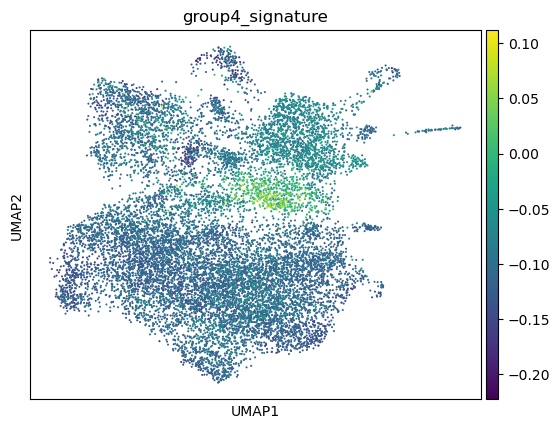

In [35]:
sc.pl.umap(adata_CD4, color='group4_signature')
#sc.pl.violin(adata, keys='group4_signature', groupby='cluster', stripplot=False)

In [36]:
top200_genes

['IGLV3-16',
 'IGHV3-49',
 'MC2R',
 'OCIAD1-AS1',
 'LINC01230',
 'GOLGA8S',
 'SPACA5',
 'PRORY',
 'HOXD-AS2',
 'SKOR1',
 'CCDC87',
 'PDZRN3-AS1',
 'HIST1H1T',
 'IGKV1D-12',
 'MTRNR2L7',
 'NPTX2',
 'DCANP1',
 'HOXD8',
 'IGLV2-18',
 'IGKV1D-13',
 'CGB5',
 'LINC00644',
 'RGS9BP',
 'TRDJ2',
 'RAG2',
 'TAAR5',
 'TRBV16',
 'MRGPRG-AS1',
 'ASTN2-AS1',
 'KRTAP4-12',
 'SP9',
 'IGKV5-2',
 'LINC01595',
 'PPP1R3C',
 'LY6G6C',
 'CRYGN',
 'KDM4E',
 'CAMK2N2',
 'NR5A1',
 'IGHJ4',
 'LINC01323',
 'DLX3',
 'CDRT15',
 'LINC00160',
 'OTOR',
 'NEUROD6',
 'TFAP2A-AS1',
 'PRAMEF14',
 'DPP9-AS1',
 'ST3GAL5-AS1',
 'IGKV3D-15',
 'IGKV1-27',
 'IGHV2-5',
 'IGHV6-1',
 'IGHV4-28',
 'IGHV3-13',
 'OR2AE1',
 'TRBV5-3',
 'HBD',
 'IGKV2D-29',
 'CLEC4G',
 'IGLV1-40',
 'IGHV2-26',
 'IGHV4-4',
 'IGHV1-18',
 'IGLV3-1',
 'IGLV2-8',
 'MEIS1-AS3',
 'TRBV12-5',
 'HSPA1A',
 'HBB',
 'BRWD1-AS1',
 'IGLV1-44',
 'IGKV1-9',
 'NRARP',
 'ZSWIM2',
 'CALHM3',
 'HSPA1B',
 'IGHV3-48',
 'FLNB-AS1',
 'IGLV7-46',
 'OR8D1',
 'IGHV4-31',
 'IGKV